In [1]:
import os
import numpy as np
import pandas as pd
import torch
import random
from streaming.base import MDSWriter

from drfp import DrfpEncoder
from bioinformatics import *
from utils import make_pie_charts, make_hierarchical_onehot

#go back a directory
os.chdir("..")

# Save all of the uniref enzymes dataset
Downloaded from uniprot with sequence, EC, taxonomy columns, lineage, lineage ID columns
The June 17, 2024 download was used

In [40]:
#df = pd.read_csv("data/uniprot_enzyme_all_240619.tsv", sep='\t')
df = pd.read_csv("data/raw_data/uniprot_enzyme_240617.tsv", sep='\t')
print(len(df))

#split_df.to_csv('data/CARE+uniref_resampled50cluster_medium/' + split + '.csv', index=False)

32866050


In [42]:
df = df.dropna(subset=['Sequence', 'EC number'])
df = df[~df['EC number'].str.contains(';')]
#shuffle the dataframe
df = df.sample(frac=1, random_state=42, replace=False)#.reset_index(drop=True)
len(df)

29418232

In [43]:
sequences = df['Sequence'].values.tolist()
ECs = df['EC number'].values.tolist()

In [29]:
indices = torch.load('data/ec-uniref2level4_onehot.pt')
print(len(indices.keys()))

5222


Write to sharded dataset (no train-test splits needed, also no taxonomy)

In [64]:
output_dir = 'data/sharded_datasets/all_uniref/train'
columns = {'sequence': 'str', 'ec': 'str'}
with MDSWriter(out=output_dir, columns=columns) as out:
    for seq, ec in zip(sequences, ECs):
        out.write({'sequence': seq, 'ec': ec})

In [46]:
EClist = df['EC number'].unique()
EClist = np.sort(EClist)
EClist

array(['1.-.-.-', '1.1.-.-', '1.1.1.-', ..., '7.6.2.7', '7.6.2.8',
       '7.6.2.9'], dtype=object)

### Generate onehot encodings of EC numbers from uniref

In [52]:
df = pd.DataFrame(columns=['EC number'], data=EClist)
df['EC1'] = df['EC number'].str.split('.').str[0]
df['EC2'] = df['EC number'].str.split('.').str[1]
df['EC3'] = df['EC number'].str.split('.').str[2]
df['EC4'] = df['EC number'].str.split('.').str[3]

#tokenize each EC number as an integer
maxes = []
for column in ['EC1', 'EC2', 'EC3', 'EC4']:
    uniques = df[column].unique()
    if column == 'EC1':
        uniques = np.append(uniques, '-')
    #none values map to -1 which means the onehot condition will be set to zero
    sorted_uniques = np.sort(uniques)
    maxes.append(len(uniques))
    df[column] = df[column].apply(lambda x: np.where(sorted_uniques == x)[0][0])
df

,EC number,EC1,EC2,EC3,EC4
0,1.-.-.-,1,0,0,0
1,1.1.-.-,1,1,0,0
2,1.1.1.-,1,1,1,0
3,1.1.1.1,1,1,1,1
4,1.1.1.10,1,1,1,2
...,...,...,...,...,...
5217,7.6.2.4,7,19,12,329
5218,7.6.2.5,7,19,12,368
5219,7.6.2.7,7,19,12,390
5220,7.6.2.8,7,19,12,401


In [53]:
#concatenate EC1, EC2, EC3, EC4 into a list
df['EC list'] = df[['EC1', 'EC2', 'EC3', 'EC4']].values.tolist()
df['encoding'] = df['EC list'].apply(lambda x: make_hierarchical_onehot(x, maxes))
df

,EC number,EC1,EC2,EC3,EC4,EC list,encoding
0,1.-.-.-,1,0,0,0,"[1, 0, 0, 0]","[tensor(1.), tensor(0.), tensor(0.), tensor(0...."
1,1.1.-.-,1,1,0,0,"[1, 1, 0, 0]","[tensor(1.), tensor(0.), tensor(0.), tensor(0...."
2,1.1.1.-,1,1,1,0,"[1, 1, 1, 0]","[tensor(1.), tensor(0.), tensor(0.), tensor(0...."
3,1.1.1.1,1,1,1,1,"[1, 1, 1, 1]","[tensor(1.), tensor(0.), tensor(0.), tensor(0...."
4,1.1.1.10,1,1,1,2,"[1, 1, 1, 2]","[tensor(1.), tensor(0.), tensor(0.), tensor(0...."
...,...,...,...,...,...,...,...
5217,7.6.2.4,7,19,12,329,"[7, 19, 12, 329]","[tensor(0.), tensor(0.), tensor(0.), tensor(0...."
5218,7.6.2.5,7,19,12,368,"[7, 19, 12, 368]","[tensor(0.), tensor(0.), tensor(0.), tensor(0...."
5219,7.6.2.7,7,19,12,390,"[7, 19, 12, 390]","[tensor(0.), tensor(0.), tensor(0.), tensor(0...."
5220,7.6.2.8,7,19,12,401,"[7, 19, 12, 401]","[tensor(0.), tensor(0.), tensor(0.), tensor(0...."


In [54]:
ec_dict = dict(zip(df['EC number'], df['encoding']))
ec_dict

{'1.-.-.-': tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 

In [50]:
torch.save(ec_dict, "data/ec-uniref2level4_onehot.pt")

### Encode taxonomy on swissprot
uses the swissprot enzymes tsv (downloaded from uniprot with taxonomy) with columns added for clustering
* downloaded around June 17, 2024
* not that the clustered file has been processed with `data_prep.ipynb` to add a column with clustering

In [3]:
df = pd.read_csv('data/processed_data/swissprot_enzyme_clustered.tsv', sep='\t')
df

,Entry,Reviewed,Entry Name,Protein names,Organism,Length,Sequence,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),EC number,cluster_50,cluster_70,cluster_90
0,A0A009IHW8,reviewed,ABTIR_ACIB9,2' cyclic ADP-D-ribose synthase AbTIR (2'cADPR...,Acinetobacter baumannii (strain 1295743),269,MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",1310613,3.2.2.-; 3.2.2.6,0,0,0
1,A0A023I7E1,reviewed,ENG1_RHIMI,"Glucan endo-1,3-beta-D-glucosidase 1 (Endo-1,3...",Rhizomucor miehei,796,MRFQVIVAAATITMITSYIPGVASQSTSDGDDLFVPVSNFDPKSIF...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",4839,3.2.1.39,1,1,1
2,A0A024B7W1,reviewed,POLG_ZIKVF,Genome polyprotein [Cleaved into: Capsid prote...,Zika virus (isolate ZIKV/Human/French Polynesi...,3423,MKNPKKKSGGFRIVNMLKRGVARVSPFGGLKRLPAGLLLGHGPIRM...,"Viruses (superkingdom), Riboviria (clade), Ort...","10239 (superkingdom), 2559587 (clade), 2732396...",2043570,2.1.1.56; 2.1.1.57; 2.7.7.48; 3.4.21.91; 3.6.1...,6975,2,150
3,A0A024SC78,reviewed,CUTI1_HYPJR,Cutinase (EC 3.1.1.74),Hypocrea jecorina (strain ATCC 56765 / BCRC 32...,248,MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",1344414,3.1.1.74,3,3,114265
4,A0A024SH76,reviewed,GUX2_HYPJR,"Exoglucanase 2 (EC 3.2.1.91) (1,4-beta-cellobi...",Hypocrea jecorina (strain ATCC 56765 / BCRC 32...,471,MIVGILTTLATLATLAASVPLEERQACSSVWGQCGGQNWSGPTCCA...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",1344414,3.2.1.91,133241,5060,5060
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255397,Q05115,reviewed,AMDA_BORBO,Arylmalonate decarboxylase (AMDase) (EC 4.1.1.76),Bordetella bronchiseptica (Alcaligenes bronchi...,240,MQQASTPTIGMIVPPAAGLVPADGARLYPDLPFIASGLGLGSVTPE...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",518,4.1.1.76,255397,255397,255397
255398,Q6HX62,reviewed,Y3032_BACAN,Putative adenine deaminase BA_3032/GBAA_3032/B...,Bacillus anthracis,584,MGQNQFRWSNEQLREHVEIIDGTRSPHKLLKNATYLNSYIREWMQA...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1392,3.5.4.2,255398,255398,255398
255399,Q6L032,reviewed,Y1085_PICTO,Putative adenine deaminase PTO1085 (Adenase) (...,Picrophilus torridus (strain ATCC 700027 / DSM...,573,MLLKNIKISNDYNIFMIIASRKPSLKDIYKIIKVSKFDEPADLIIE...,"cellular organisms (no rank), Archaea (superki...","131567 (no rank), 2157 (superkingdom), 2283796...",1122961,3.5.4.2,255399,255399,255399
255400,Q7TDB6,reviewed,RDRP_MYRV9,RNA-directed RNA polymerase VP1 (EC 2.7.7.48),Cryphonectria parasitica mycoreovirus 1 (strai...,1354,MSLTSRYTHFVPDSTITEILNDSNTPQILLHYANIVNGSTPVHFTS...,"Viruses (superkingdom), Riboviria (clade), Ort...","10239 (superkingdom), 2559587 (clade), 2732396...",230407,2.7.7.48,255400,255400,255400


In [21]:
def process_taxonomic_lineage(taxonomic_lineage):
    split_taxonomy = taxonomic_lineage.split(', ')
    #split on the space between the taxonomic level and the name
    split_taxonomy = [taxon.split(' ', 1) for taxon in split_taxonomy]
    #make into a dictionary from the second element to the first
    split_taxonomy = {taxon[1]: taxon[0] for taxon in split_taxonomy}
    #keep only the taxonomic levels we are interested in
    #split_taxonomy = {taxon: split_taxonomy[taxon] for taxon in ['(superkingdom)', '(phylum)', '(class)', '(order)', '(family)', '(genus)', '(species)'] if taxon in split_taxonomy}

    #return 7 values
    return [int(split_taxonomy.get(taxon, -1)) for taxon in ['(superkingdom)', '(phylum)', '(class)', '(order)', '(family)', '(genus)', '(species)']]

#apply to the dataframe
df[['superkingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species']] = df['Taxonomic lineage (Ids)'].apply(process_taxonomic_lineage).apply(pd.Series)
df

,Entry,Reviewed,Entry Name,Protein names,Organism,Length,Sequence,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),...,cluster_50,cluster_70,cluster_90,superkingdom,phylum,class,order,family,genus,species
0,A0A009IHW8,reviewed,ABTIR_ACIB9,2' cyclic ADP-D-ribose synthase AbTIR (2'cADPR...,Acinetobacter baumannii (strain 1295743),269,MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",1310613,...,0,0,0,2,1224,1236,2887326,468,469,470
1,A0A023I7E1,reviewed,ENG1_RHIMI,"Glucan endo-1,3-beta-D-glucosidase 1 (Endo-1,3...",Rhizomucor miehei,796,MRFQVIVAAATITMITSYIPGVASQSTSDGDDLFVPVSNFDPKSIF...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",4839,...,1,1,1,2759,1913637,2212703,4827,499202,4838,-1
2,A0A024B7W1,reviewed,POLG_ZIKVF,Genome polyprotein [Cleaved into: Capsid prote...,Zika virus (isolate ZIKV/Human/French Polynesi...,3423,MKNPKKKSGGFRIVNMLKRGVARVSPFGGLKRLPAGLLLGHGPIRM...,"Viruses (superkingdom), Riboviria (clade), Ort...","10239 (superkingdom), 2559587 (clade), 2732396...",2043570,...,6975,2,150,10239,2732406,2732462,2732545,11050,3044782,3048459
3,A0A024SC78,reviewed,CUTI1_HYPJR,Cutinase (EC 3.1.1.74),Hypocrea jecorina (strain ATCC 56765 / BCRC 32...,248,MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",1344414,...,3,3,114265,2759,4890,147550,5125,5129,5543,51453
4,A0A024SH76,reviewed,GUX2_HYPJR,"Exoglucanase 2 (EC 3.2.1.91) (1,4-beta-cellobi...",Hypocrea jecorina (strain ATCC 56765 / BCRC 32...,471,MIVGILTTLATLATLAASVPLEERQACSSVWGQCGGQNWSGPTCCA...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",1344414,...,133241,5060,5060,2759,4890,147550,5125,5129,5543,51453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255397,Q05115,reviewed,AMDA_BORBO,Arylmalonate decarboxylase (AMDase) (EC 4.1.1.76),Bordetella bronchiseptica (Alcaligenes bronchi...,240,MQQASTPTIGMIVPPAAGLVPADGARLYPDLPFIASGLGLGSVTPE...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",518,...,255397,255397,255397,2,1224,28216,80840,506,517,-1
255398,Q6HX62,reviewed,Y3032_BACAN,Putative adenine deaminase BA_3032/GBAA_3032/B...,Bacillus anthracis,584,MGQNQFRWSNEQLREHVEIIDGTRSPHKLLKNATYLNSYIREWMQA...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1392,...,255398,255398,255398,2,1239,91061,1385,186817,1386,-1
255399,Q6L032,reviewed,Y1085_PICTO,Putative adenine deaminase PTO1085 (Adenase) (...,Picrophilus torridus (strain ATCC 700027 / DSM...,573,MLLKNIKISNDYNIFMIIASRKPSLKDIYKIIKVSKFDEPADLIIE...,"cellular organisms (no rank), Archaea (superki...","131567 (no rank), 2157 (superkingdom), 2283796...",1122961,...,255399,255399,255399,2157,2283796,183967,2301,46630,46631,46632
255400,Q7TDB6,reviewed,RDRP_MYRV9,RNA-directed RNA polymerase VP1 (EC 2.7.7.48),Cryphonectria parasitica mycoreovirus 1 (strai...,1354,MSLTSRYTHFVPDSTITEILNDSNTPQILLHYANIVNGSTPVHFTS...,"Viruses (superkingdom), Riboviria (clade), Ort...","10239 (superkingdom), 2559587 (clade), 2732396...",230407,...,255400,255400,255400,10239,2732405,2732459,2732541,2946187,311227,311228


In [22]:
#join together the columns as a string separated by .
columns = ['superkingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species']
df['Tax number'] = df[columns].astype(str).apply('.'.join, axis=1)
df

,Entry,Reviewed,Entry Name,Protein names,Organism,Length,Sequence,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),...,cluster_70,cluster_90,superkingdom,phylum,class,order,family,genus,species,Tax number
0,A0A009IHW8,reviewed,ABTIR_ACIB9,2' cyclic ADP-D-ribose synthase AbTIR (2'cADPR...,Acinetobacter baumannii (strain 1295743),269,MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",1310613,...,0,0,2,1224,1236,2887326,468,469,470,2.1224.1236.2887326.468.469.470
1,A0A023I7E1,reviewed,ENG1_RHIMI,"Glucan endo-1,3-beta-D-glucosidase 1 (Endo-1,3...",Rhizomucor miehei,796,MRFQVIVAAATITMITSYIPGVASQSTSDGDDLFVPVSNFDPKSIF...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",4839,...,1,1,2759,1913637,2212703,4827,499202,4838,-1,2759.1913637.2212703.4827.499202.4838.-1
2,A0A024B7W1,reviewed,POLG_ZIKVF,Genome polyprotein [Cleaved into: Capsid prote...,Zika virus (isolate ZIKV/Human/French Polynesi...,3423,MKNPKKKSGGFRIVNMLKRGVARVSPFGGLKRLPAGLLLGHGPIRM...,"Viruses (superkingdom), Riboviria (clade), Ort...","10239 (superkingdom), 2559587 (clade), 2732396...",2043570,...,2,150,10239,2732406,2732462,2732545,11050,3044782,3048459,10239.2732406.2732462.2732545.11050.3044782.30...
3,A0A024SC78,reviewed,CUTI1_HYPJR,Cutinase (EC 3.1.1.74),Hypocrea jecorina (strain ATCC 56765 / BCRC 32...,248,MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",1344414,...,3,114265,2759,4890,147550,5125,5129,5543,51453,2759.4890.147550.5125.5129.5543.51453
4,A0A024SH76,reviewed,GUX2_HYPJR,"Exoglucanase 2 (EC 3.2.1.91) (1,4-beta-cellobi...",Hypocrea jecorina (strain ATCC 56765 / BCRC 32...,471,MIVGILTTLATLATLAASVPLEERQACSSVWGQCGGQNWSGPTCCA...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",1344414,...,5060,5060,2759,4890,147550,5125,5129,5543,51453,2759.4890.147550.5125.5129.5543.51453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255397,Q05115,reviewed,AMDA_BORBO,Arylmalonate decarboxylase (AMDase) (EC 4.1.1.76),Bordetella bronchiseptica (Alcaligenes bronchi...,240,MQQASTPTIGMIVPPAAGLVPADGARLYPDLPFIASGLGLGSVTPE...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",518,...,255397,255397,2,1224,28216,80840,506,517,-1,2.1224.28216.80840.506.517.-1
255398,Q6HX62,reviewed,Y3032_BACAN,Putative adenine deaminase BA_3032/GBAA_3032/B...,Bacillus anthracis,584,MGQNQFRWSNEQLREHVEIIDGTRSPHKLLKNATYLNSYIREWMQA...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1392,...,255398,255398,2,1239,91061,1385,186817,1386,-1,2.1239.91061.1385.186817.1386.-1
255399,Q6L032,reviewed,Y1085_PICTO,Putative adenine deaminase PTO1085 (Adenase) (...,Picrophilus torridus (strain ATCC 700027 / DSM...,573,MLLKNIKISNDYNIFMIIASRKPSLKDIYKIIKVSKFDEPADLIIE...,"cellular organisms (no rank), Archaea (superki...","131567 (no rank), 2157 (superkingdom), 2283796...",1122961,...,255399,255399,2157,2283796,183967,2301,46630,46631,46632,2157.2283796.183967.2301.46630.46631.46632
255400,Q7TDB6,reviewed,RDRP_MYRV9,RNA-directed RNA polymerase VP1 (EC 2.7.7.48),Cryphonectria parasitica mycoreovirus 1 (strai...,1354,MSLTSRYTHFVPDSTITEILNDSNTPQILLHYANIVNGSTPVHFTS...,"Viruses (superkingdom), Riboviria (clade), Ort...","10239 (superkingdom), 2559587 (clade), 2732396...",230407,...,255400,255400,10239,2732405,2732459,2732541,2946187,311227,311228,10239.2732405.2732459.2732541.2946187.311227.3...


In [23]:
#merge together the 7 taxa columns as a list
for i, column in enumerate(columns):
    df['upto ' + column] =  tuple(map(tuple, df[columns[:i+1]].values))
df

,Entry,Reviewed,Entry Name,Protein names,Organism,Length,Sequence,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),...,genus,species,Tax number,upto superkingdom,upto phylum,upto class,upto order,upto family,upto genus,upto species
0,A0A009IHW8,reviewed,ABTIR_ACIB9,2' cyclic ADP-D-ribose synthase AbTIR (2'cADPR...,Acinetobacter baumannii (strain 1295743),269,MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",1310613,...,469,470,2.1224.1236.2887326.468.469.470,"(2,)","(2, 1224)","(2, 1224, 1236)","(2, 1224, 1236, 2887326)","(2, 1224, 1236, 2887326, 468)","(2, 1224, 1236, 2887326, 468, 469)","(2, 1224, 1236, 2887326, 468, 469, 470)"
1,A0A023I7E1,reviewed,ENG1_RHIMI,"Glucan endo-1,3-beta-D-glucosidase 1 (Endo-1,3...",Rhizomucor miehei,796,MRFQVIVAAATITMITSYIPGVASQSTSDGDDLFVPVSNFDPKSIF...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",4839,...,4838,-1,2759.1913637.2212703.4827.499202.4838.-1,"(2759,)","(2759, 1913637)","(2759, 1913637, 2212703)","(2759, 1913637, 2212703, 4827)","(2759, 1913637, 2212703, 4827, 499202)","(2759, 1913637, 2212703, 4827, 499202, 4838)","(2759, 1913637, 2212703, 4827, 499202, 4838, -1)"
2,A0A024B7W1,reviewed,POLG_ZIKVF,Genome polyprotein [Cleaved into: Capsid prote...,Zika virus (isolate ZIKV/Human/French Polynesi...,3423,MKNPKKKSGGFRIVNMLKRGVARVSPFGGLKRLPAGLLLGHGPIRM...,"Viruses (superkingdom), Riboviria (clade), Ort...","10239 (superkingdom), 2559587 (clade), 2732396...",2043570,...,3044782,3048459,10239.2732406.2732462.2732545.11050.3044782.30...,"(10239,)","(10239, 2732406)","(10239, 2732406, 2732462)","(10239, 2732406, 2732462, 2732545)","(10239, 2732406, 2732462, 2732545, 11050)","(10239, 2732406, 2732462, 2732545, 11050, 3044...","(10239, 2732406, 2732462, 2732545, 11050, 3044..."
3,A0A024SC78,reviewed,CUTI1_HYPJR,Cutinase (EC 3.1.1.74),Hypocrea jecorina (strain ATCC 56765 / BCRC 32...,248,MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",1344414,...,5543,51453,2759.4890.147550.5125.5129.5543.51453,"(2759,)","(2759, 4890)","(2759, 4890, 147550)","(2759, 4890, 147550, 5125)","(2759, 4890, 147550, 5125, 5129)","(2759, 4890, 147550, 5125, 5129, 5543)","(2759, 4890, 147550, 5125, 5129, 5543, 51453)"
4,A0A024SH76,reviewed,GUX2_HYPJR,"Exoglucanase 2 (EC 3.2.1.91) (1,4-beta-cellobi...",Hypocrea jecorina (strain ATCC 56765 / BCRC 32...,471,MIVGILTTLATLATLAASVPLEERQACSSVWGQCGGQNWSGPTCCA...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",1344414,...,5543,51453,2759.4890.147550.5125.5129.5543.51453,"(2759,)","(2759, 4890)","(2759, 4890, 147550)","(2759, 4890, 147550, 5125)","(2759, 4890, 147550, 5125, 5129)","(2759, 4890, 147550, 5125, 5129, 5543)","(2759, 4890, 147550, 5125, 5129, 5543, 51453)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255397,Q05115,reviewed,AMDA_BORBO,Arylmalonate decarboxylase (AMDase) (EC 4.1.1.76),Bordetella bronchiseptica (Alcaligenes bronchi...,240,MQQASTPTIGMIVPPAAGLVPADGARLYPDLPFIASGLGLGSVTPE...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",518,...,517,-1,2.1224.28216.80840.506.517.-1,"(2,)","(2, 1224)","(2, 1224, 28216)","(2, 1224, 28216, 80840)","(2, 1224, 28216, 80840, 506)","(2, 1224, 28216, 80840, 506, 517)","(2, 1224, 28216, 80840, 506, 517, -1)"
255398,Q6HX62,reviewed,Y3032_BACAN,Putative adenine deaminase BA_3032/GBAA_3032/B...,Bacillus anthracis,584,MGQNQFRWSNEQLREHVEIIDGTRSPHKLLKNATYLNSYIREWMQA...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1392,...,1386,-1,2.1239.91061.1385.186817.1386.-1,"(2,)","(2, 1239)","(2, 1239, 91061)","(2, 1239, 91061, 1385)","(2, 1239, 91061, 1385, 186817)","(2, 1

In [126]:
from tqdm import tqdm
lineage2encoding = {}
unique_df = df.drop_duplicates(subset='upto species')
tqdm_iterator = tqdm(range(len(unique_df['upto species'])), desc="Processing")
columns = ['superkingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species']

for lineage in unique_df['upto species']:
    new_encoding = np.zeros(7, dtype=int)
    for i in range(7):
        target = lineage[i]
        partial_lineage = lineage[:i]
        column = columns[i]

        if column != 'superkingdom':
            previous_column = columns[i-1]
            subset = unique_df[unique_df["upto " + previous_column] == partial_lineage]
        else:
            subset = unique_df

        uniques = subset[column].unique()
        #append -1 if it is not present
        if -1 not in uniques:
            uniques = np.append(uniques, -1)

        #none values map to -1 which means the onehot condition will be set to zero
        sorted_uniques = np.sort(uniques)
        index = np.where(sorted_uniques == target)[0][0]
        # print(index)
        new_encoding[i] = index
    lineage2encoding[lineage] = new_encoding
    tqdm_iterator.update(1)

Processing: 100%|██████████| 4577/4577 [04:17<00:00, 17.79it/s] 


In [128]:
#join the keys on .
#stack the encodings
encodings = np.stack(list(lineage2encoding.values()))
maxes = np.max(encodings, axis=0).astype(int) + 1

lineage2encoding = { '.'.join(map(str, key)): value for key, value in lineage2encoding.items()}
#apply hierarchical onehot to the values of the dictionary
for key, value in lineage2encoding.items():
    lineage2encoding[key] = make_hierarchical_onehot(value, maxes)

lineage2encoding

{'2.1224.1236.2887326.468.469.470': tensor([1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0

In [149]:
torch.save(lineage2encoding, 'data/tax2onehot.pt')

Load previously saved taxonomy encoding and simplify it for only superkingdoms

In [2]:
lineage2encoding = torch.load('data/tax2onehot.pt')
lineage2encoding

{'2.1224.1236.2887326.468.469.470': tensor([1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0

In [3]:
#only take the first 4 dimenions of the onehot encoding
lineage2encoding = {key: value[:4] for key, value in lineage2encoding.items()}
lineage2encoding

{'2.1224.1236.2887326.468.469.470': tensor([1., 0., 0., 0.]),
 '2759.1913637.2212703.4827.499202.4838.-1': tensor([0., 0., 1., 0.]),
 '10239.2732406.2732462.2732545.11050.3044782.3048459': tensor([0., 0., 0., 1.]),
 '2759.4890.147550.5125.5129.5543.51453': tensor([0., 0., 1., 0.]),
 '2759.6231.119089.6236.6296.6281.-1': tensor([0., 0., 1., 0.]),
 '2759.35493.3398.4069.4070.4101.-1': tensor([0., 0., 1., 0.]),
 '2759.6231.119089.6236.6243.6237.-1': tensor([0., 0., 1., 0.]),
 '2759.7711.40674.9989.337677.10028.-1': tensor([0., 0., 1., 0.]),
 '2759.35493.3398.41945.19955.13492.-1': tensor([0., 0., 1., 0.]),
 '2759.35493.3398.4036.4050.4053.-1': tensor([0., 0., 1., 0.]),
 '2759.35493.3398.72025.3803.3877.-1': tensor([0., 0., 1., 0.]),
 '2.1224.28211.356.82115.323620.-1': tensor([1., 0., 0., 0.]),
 '2759.35493.3398.4055.4056.4059.-1': tensor([0., 0., 1., 0.]),
 '2759.35493.3398.4055.4056.60092.-1': tensor([0., 0., 1., 0.]),
 '2759.35493.3398.38820.4479.4527.4530': tensor([0., 0., 1., 0.]),
 

In [4]:
torch.save(lineage2encoding, 'data/tax2level1_onehot.pt')

# Below stuff does not require as much memory

In [3]:
sampled_uniref_enzymes = pd.read_csv('data/sampled_uniref_enzymes.csv')
sampled_uniref_enzymes

,Entry,Entry Name,Organism,Length,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),Sequence,EC number
0,A0A939C5B7,A0A939C5B7_LIMMU,Limosilactobacillus mucosae (Lactobacillus muc...,166,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",97478,LGNLGIQFAHNVFGAHVVAVDGNPDKLEAAKKEGAEVLINRHDGNV...,1.1.1.1
1,A0A1I4ZKG4,A0A1I4ZKG4_9GAMM,Dokdonella immobilis,377,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",578942,MKVRAAVLREMGRPAPYADSRPLSIEQIELSPPASGELRVRVLAAG...,1.1.1.1
2,A0A9W7SBW7,A0A9W7SBW7_9BACI,Bacillus sp. EKM501B,345,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1683636,MKAVVVNKNSKANIEVIDKELRPLHSGEALVDVEYCGVCHTDLHVA...,1.1.1.1
3,A0A496WIK8,A0A496WIK8_9GAMM,Gammaproteobacteria bacterium,369,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",1913989,MKCKAAVAWEPKKPLQIEEVEVAGPREGEVLLKVVASGVCHTDAFT...,1.1.1.1
4,P25988,ADH_SCAAL,Scaptomyza albovittata (Fruit fly),254,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",7299,MCIAGKNIIFVAGLGGIGLDTNREIVKSGPKNLVILDRIENPAAIA...,1.1.1.1
...,...,...,...,...,...,...,...,...,...
815293,A0A315WZ92,A0A315WZ92_9PSED,Pseudomonas sp. SDI,384,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2170734,MIELQNLGKTFHSNGKAIKAVDSVSLTVNEGEICVFLGPSGCGKST...,7.6.2.9
815294,A0A6A7Y0M2,A0A6A7Y0M2_9HYPH,Segnochrobactrum spirostomi,411,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2608987,MTRPAAARDALVHSSDQPIRVRLEALTKIFGPSPAAAQTLLDRGAS...,7.6.2.9
815295,A0A5B6U1L2,A0A5B6U1L2_9HYPH,Mesorhizobium sp. SARCC-RB16n,357,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2116687,MTETMEQASNAMGKDPRPIKLACRNVWKLFGANAANFIRERDGKAS...,7.6.2.9
815296,G4NTT4,G4NTT4_BACS4,Bacillus spizizenii (strain DSM 15029 / JCM 12...,418,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1052585,MSVDEKPIKIKVEKVSKIFGKQTKKAVQMLANGKTKKEILKATGST...,7.6.2.9


In [6]:
sampled_uniref_enzymes['EC All'] = sampled_uniref_enzymes['EC number']
#split ec number on ; and explode
sampled_uniref_enzymes['EC number'] = sampled_uniref_enzymes['EC number'].str.split(';')
sampled_uniref_enzymes = sampled_uniref_enzymes.explode('EC number')
sampled_uniref_enzymes

,Entry,Entry Name,Organism,Length,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),Sequence,EC number,EC All
0,A0A939C5B7,A0A939C5B7_LIMMU,Limosilactobacillus mucosae (Lactobacillus muc...,166,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",97478,LGNLGIQFAHNVFGAHVVAVDGNPDKLEAAKKEGAEVLINRHDGNV...,1.1.1.1,1.1.1.1
1,A0A1I4ZKG4,A0A1I4ZKG4_9GAMM,Dokdonella immobilis,377,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",578942,MKVRAAVLREMGRPAPYADSRPLSIEQIELSPPASGELRVRVLAAG...,1.1.1.1,1.1.1.1
2,A0A9W7SBW7,A0A9W7SBW7_9BACI,Bacillus sp. EKM501B,345,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1683636,MKAVVVNKNSKANIEVIDKELRPLHSGEALVDVEYCGVCHTDLHVA...,1.1.1.1,1.1.1.1
3,A0A496WIK8,A0A496WIK8_9GAMM,Gammaproteobacteria bacterium,369,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",1913989,MKCKAAVAWEPKKPLQIEEVEVAGPREGEVLLKVVASGVCHTDAFT...,1.1.1.1,1.1.1.1
4,P25988,ADH_SCAAL,Scaptomyza albovittata (Fruit fly),254,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",7299,MCIAGKNIIFVAGLGGIGLDTNREIVKSGPKNLVILDRIENPAAIA...,1.1.1.1,1.1.1.1
...,...,...,...,...,...,...,...,...,...,...
815293,A0A315WZ92,A0A315WZ92_9PSED,Pseudomonas sp. SDI,384,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2170734,MIELQNLGKTFHSNGKAIKAVDSVSLTVNEGEICVFLGPSGCGKST...,7.6.2.9,7.6.2.9
815294,A0A6A7Y0M2,A0A6A7Y0M2_9HYPH,Segnochrobactrum spirostomi,411,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2608987,MTRPAAARDALVHSSDQPIRVRLEALTKIFGPSPAAAQTLLDRGAS...,7.6.2.9,7.6.2.9
815295,A0A5B6U1L2,A0A5B6U1L2_9HYPH,Mesorhizobium sp. SARCC-RB16n,357,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2116687,MTETMEQASNAMGKDPRPIKLACRNVWKLFGANAANFIRERDGKAS...,7.6.2.9,7.6.2.9
815296,G4NTT4,G4NTT4_BACS4,Bacillus spizizenii (strain DSM 15029 / JCM 12...,418,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1052585,MSVDEKPIKIKVEKVSKIFGKQTKKAVQMLANGKTKKEILKATGST...,7.6.2.9,7.6.2.9


In [7]:
swissprot_enzymes = pd.read_csv('data/protein2EC.csv')
swissprot_enzymes

,Entry,Entry Name,Sequence,EC number,Length,EC All,clusterRes50,clusterRes30,clusterRes70,clusterRes90,EC3,EC2,EC1
0,A0A009IHW8,ABTIR_ACIB9,MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...,3.2.2.6,269,3.2.2.-; 3.2.2.6,A0A009IHW8,A1AY86,A0A009IHW8,A0A009IHW8,3.2.2,3.2,3
1,A0A024SC78,CUTI1_HYPJR,MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...,3.1.1.74,248,3.1.1.74,A8QPD8,A8QPD8,A8QPD8,A0A024SC78,3.1.1,3.1,3
2,A0A024SH76,GUX2_HYPJR,MIVGILTTLATLATLAASVPLEERQACSSVWGQCGGQNWSGPTCCA...,3.2.1.91,471,3.2.1.91,B2ABX7,B2AE04,A0A024SH76,A0A024SH76,3.2.1,3.2,3
3,A0A059TC02,CCR1_PETHY,MRSVSGQVVCVTGAGGFIASWLVKILLEKGYTVRGTVRNPDDPKNG...,1.2.1.44,333,1.2.1.44,Q6K9A2,Q5FB34,Q9S9N9,A0A059TC02,1.2.1,1.2,1
4,A0A067XGX8,AROG2_PETHY,MALTATATTRGGSALPNSCLQTPKFQSLQKPTFISSFPTNKKTKPR...,2.5.1.54,512,2.5.1.54,P80574,P80576,Q75W16,A0A067XGX8,2.5.1,2.5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
169860,Q05115,AMDA_BORBO,MQQASTPTIGMIVPPAAGLVPADGARLYPDLPFIASGLGLGSVTPE...,4.1.1.76,240,4.1.1.76,Q05115,Q05115,Q05115,Q05115,4.1.1,4.1,4
169861,Q6HX62,Y3032_BACAN,MGQNQFRWSNEQLREHVEIIDGTRSPHKLLKNATYLNSYIREWMQA...,3.5.4.2,584,3.5.4.2,Q6HX62,O34909,Q81BX6,Q6HX62,3.5.4,3.5,3
169862,Q6L032,Y1085_PICTO,MLLKNIKISNDYNIFMIIASRKPSLKDIYKIIKVSKFDEPADLIIE...,3.5.4.2,573,3.5.4.2,Q6L032,O34909,Q6L032,Q6L032,3.5.4,3.5,3
169863,Q94MV8,VG56_BPLZ5,MAHFNECAHLIEGVDKANRAYAENIMHNIDPLQVMLDMQRHLQIRL...,3.6.1.12,172,3.6.1.12,P39262,P39262,Q94MV8,Q94MV8,3.6.1,3.6,3


In [11]:
all_enzymes

,Entry,Entry Name,Sequence,EC number,Length,EC All,clusterRes50,clusterRes30,clusterRes70,clusterRes90,EC3,EC2,EC1,Organism,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID)
0,A0A009IHW8,ABTIR_ACIB9,MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...,3.2.2.6,269,3.2.2.-; 3.2.2.6,A0A009IHW8,A1AY86,A0A009IHW8,A0A009IHW8,3.2.2,3.2,3.0,NaN,NaN,NaN,NaN
1,A0A024SC78,CUTI1_HYPJR,MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...,3.1.1.74,248,3.1.1.74,A8QPD8,A8QPD8,A8QPD8,A0A024SC78,3.1.1,3.1,3.0,NaN,NaN,NaN,NaN
2,A0A024SH76,GUX2_HYPJR,MIVGILTTLATLATLAASVPLEERQACSSVWGQCGGQNWSGPTCCA...,3.2.1.91,471,3.2.1.91,B2ABX7,B2AE04,A0A024SH76,A0A024SH76,3.2.1,3.2,3.0,NaN,NaN,NaN,NaN
3,A0A059TC02,CCR1_PETHY,MRSVSGQVVCVTGAGGFIASWLVKILLEKGYTVRGTVRNPDDPKNG...,1.2.1.44,333,1.2.1.44,Q6K9A2,Q5FB34,Q9S9N9,A0A059TC02,1.2.1,1.2,1.0,NaN,NaN,NaN,NaN
4,A0A067XGX8,AROG2_PETHY,MALTATATTRGGSALPNSCLQTPKFQSLQKPTFISSFPTNKKTKPR...,2.5.1.54,512,2.5.1.54,P80574,P80576,Q75W16,A0A067XGX8,2.5.1,2.5,2.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
815293,A0A315WZ92,A0A315WZ92_9PSED,MIELQNLGKTFHSNGKAIKAVDSVSLTVNEGEICVFLGPSGCGKST...,7.6.2.9,384,7.6.2.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pseudomonas sp. SDI,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2170734.0
815294,A0A6A7Y0M2,A0A6A7Y0M2_9HYPH,MTRPAAARDALVHSSDQPIRVRLEALTKIFGPSPAAAQTLLDRGAS...,7.6.2.9,411,7.6.2.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Segnochrobactrum spirostomi,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2608987.0
815295,A0A5B6U1L2,A0A5B6U1L2_9HYPH,MTETMEQASNAMGKDPRPIKLACRNVWKLFGANAANFIRERDGKAS...,7.6.2.9,357,7.6.2.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mesorhizobium sp. SARCC-RB16n,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2116687.0
815296,G4NTT4,G4NTT4_BACS4,MSVDEKPIKIKVEKVSKIFGKQTKKAVQMLANGKTKKEILKATGST...,7.6.2.9,418,7.6.2.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bacillus spizizenii (strain DSM 15029 / JCM 12...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1052585.0


In [16]:
all_enzymes = pd.concat([swissprot_enzymes, sampled_uniref_enzymes])
all_enzymes.drop_duplicates(subset=['Sequence', 'EC number'], inplace=True)
#drop clusterRes50 column
all_enzymes.drop(columns=['clusterRes30', 'clusterRes50', 'clusterRes70', 'clusterRes90'], inplace=True)
all_enzymes

,Entry,Entry Name,Sequence,EC number,Length,EC All,EC3,EC2,EC1,Organism,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID)
0,A0A009IHW8,ABTIR_ACIB9,MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...,3.2.2.6,269,3.2.2.-; 3.2.2.6,3.2.2,3.2,3.0,NaN,NaN,NaN,NaN
1,A0A024SC78,CUTI1_HYPJR,MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...,3.1.1.74,248,3.1.1.74,3.1.1,3.1,3.0,NaN,NaN,NaN,NaN
2,A0A024SH76,GUX2_HYPJR,MIVGILTTLATLATLAASVPLEERQACSSVWGQCGGQNWSGPTCCA...,3.2.1.91,471,3.2.1.91,3.2.1,3.2,3.0,NaN,NaN,NaN,NaN
3,A0A059TC02,CCR1_PETHY,MRSVSGQVVCVTGAGGFIASWLVKILLEKGYTVRGTVRNPDDPKNG...,1.2.1.44,333,1.2.1.44,1.2.1,1.2,1.0,NaN,NaN,NaN,NaN
4,A0A067XGX8,AROG2_PETHY,MALTATATTRGGSALPNSCLQTPKFQSLQKPTFISSFPTNKKTKPR...,2.5.1.54,512,2.5.1.54,2.5.1,2.5,2.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
815293,A0A315WZ92,A0A315WZ92_9PSED,MIELQNLGKTFHSNGKAIKAVDSVSLTVNEGEICVFLGPSGCGKST...,7.6.2.9,384,7.6.2.9,NaN,NaN,NaN,Pseudomonas sp. SDI,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2170734.0
815294,A0A6A7Y0M2,A0A6A7Y0M2_9HYPH,MTRPAAARDALVHSSDQPIRVRLEALTKIFGPSPAAAQTLLDRGAS...,7.6.2.9,411,7.6.2.9,NaN,NaN,NaN,Segnochrobactrum spirostomi,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2608987.0
815295,A0A5B6U1L2,A0A5B6U1L2_9HYPH,MTETMEQASNAMGKDPRPIKLACRNVWKLFGANAANFIRERDGKAS...,7.6.2.9,357,7.6.2.9,NaN,NaN,NaN,Mesorhizobium sp. SARCC-RB16n,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2116687.0
815296,G4NTT4,G4NTT4_BACS4,MSVDEKPIKIKVEKVSKIFGKQTKKAVQMLANGKTKKEILKATGST...,7.6.2.9,418,7.6.2.9,NaN,NaN,NaN,Bacillus spizizenii (strain DSM 15029 / JCM 12...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1052585.0


<Axes: >

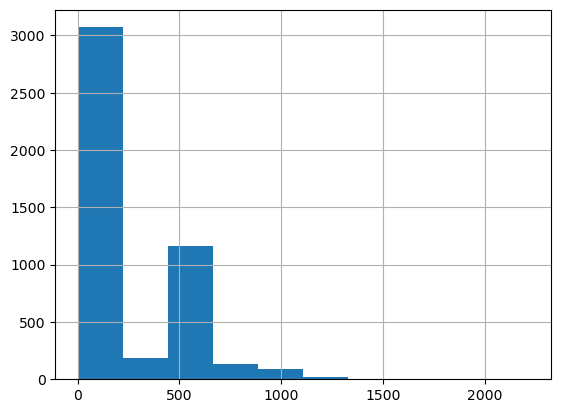

In [17]:
all_enzymes['EC number'].value_counts().hist()

In [18]:
sequences = all_enzymes['Sequence'].values
if isinstance(sequences, str):
    fasta = sequences
    f = None
else:
    f = tempfile.NamedTemporaryFile("w")
    fasta = f.name
    seqs_to_fasta(sequences, fasta)

for cluster_id in (0.5, 0.7, 0.9):
    all_enzymes = all_enzymes.merge(cluster(fasta, cluster_id), left_on="Sequence", right_on="sequence", how="left")

/tmp/tmprgpjc7qz/ exists and will be overwritten
Create directory /tmp/tmprgpjc7qz/tmp
easy-cluster /tmp/tmp7jp9jt8a /tmp/tmprgpjc7qz/ /tmp/tmprgpjc7qz/tmp --min-seq-id 0.5 

MMseqs Version:                     	6f45232ac8daca14e354ae320a4359056ec524c2
Substitution matrix                 	aa:blosum62.out,nucl:nucleotide.out
Seed substitution matrix            	aa:VTML80.out,nucl:nucleotide.out
Sensitivity                         	4
k-mer length                        	0
Target search mode                  	0
k-score                             	seq:2147483647,prof:2147483647
Alphabet size                       	aa:21,nucl:5
Max sequence length                 	65535
Max results per query               	20
Split database                      	0
Split mode                          	2
Split memory limit                  	0
Coverage threshold                  	0.8
Coverage mode                       	0
Compositional bias                  	1
Compositional bias                  	1
Diagonal s

In [20]:
all_enzymes.drop(columns=['sequence', 'sequence_x', 'sequence_y'], inplace=True)
all_enzymes

,Entry,Entry Name,Sequence,EC number,Length,EC All,EC3,EC2,EC1,Organism,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),cluster_50,cluster_70,cluster_90
0,A0A009IHW8,ABTIR_ACIB9,MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...,3.2.2.6,269,3.2.2.-; 3.2.2.6,3.2.2,3.2,3.0,NaN,NaN,NaN,NaN,0,0,0
1,A0A024SC78,CUTI1_HYPJR,MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...,3.1.1.74,248,3.1.1.74,3.1.1,3.1,3.0,NaN,NaN,NaN,NaN,588274,588274,1
2,A0A024SH76,GUX2_HYPJR,MIVGILTTLATLATLAASVPLEERQACSSVWGQCGGQNWSGPTCCA...,3.2.1.91,471,3.2.1.91,3.2.1,3.2,3.0,NaN,NaN,NaN,NaN,34416,2,2
3,A0A059TC02,CCR1_PETHY,MRSVSGQVVCVTGAGGFIASWLVKILLEKGYTVRGTVRNPDDPKNG...,1.2.1.44,333,1.2.1.44,1.2.1,1.2,1.0,NaN,NaN,NaN,NaN,11119,15051,3
4,A0A067XGX8,AROG2_PETHY,MALTATATTRGGSALPNSCLQTPKFQSLQKPTFISSFPTNKKTKPR...,2.5.1.54,512,2.5.1.54,2.5.1,2.5,2.0,NaN,NaN,NaN,NaN,467076,111235,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
924802,A0A315WZ92,A0A315WZ92_9PSED,MIELQNLGKTFHSNGKAIKAVDSVSLTVNEGEICVFLGPSGCGKST...,7.6.2.9,384,7.6.2.9,NaN,NaN,NaN,Pseudomonas sp. SDI,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2170734.0,924711,924607,924444
924803,A0A6A7Y0M2,A0A6A7Y0M2_9HYPH,MTRPAAARDALVHSSDQPIRVRLEALTKIFGPSPAAAQTLLDRGAS...,7.6.2.9,411,7.6.2.9,NaN,NaN,NaN,Segnochrobactrum spirostomi,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2608987.0,924384,924803,924803
924804,A0A5B6U1L2,A0A5B6U1L2_9HYPH,MTETMEQASNAMGKDPRPIKLACRNVWKLFGANAANFIRERDGKAS...,7.6.2.9,357,7.6.2.9,NaN,NaN,NaN,Mesorhizobium sp. SARCC-RB16n,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2116687.0,924394,924470,924394
924805,G4NTT4,G4NTT4_BACS4,MSVDEKPIKIKVEKVSKIFGKQTKKAVQMLANGKTKKEILKATGST...,7.6.2.9,418,7.6.2.9,NaN,NaN,NaN,Bacillus spizizenii (strain DSM 15029 / JCM 12...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1052585.0,924568,924805,924805


In [21]:
all_enzymes.to_csv('data/sammpled_clustered_swissprot+uniref.csv', index=False)

### load from here

In [2]:
all_enzymes = pd.read_csv('data/sammpled_clustered_swissprot+uniref.csv')
all_enzymes

/tmp/ipykernel_2141769/2466958312.py:1: DtypeWarning: Columns (6,9,10,11) have mixed types. Specify dtype option on import or set low_memory=False.
  all_enzymes = pd.read_csv('data/sammpled_clustered_swissprot+uniref.csv')


,Entry,Entry Name,Sequence,EC number,Length,EC All,EC3,EC2,EC1,Organism,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),cluster_50,cluster_70,cluster_90
0,A0A009IHW8,ABTIR_ACIB9,MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...,3.2.2.6,269,3.2.2.-; 3.2.2.6,3.2.2,3.2,3.0,NaN,NaN,NaN,NaN,0,0,0
1,A0A024SC78,CUTI1_HYPJR,MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...,3.1.1.74,248,3.1.1.74,3.1.1,3.1,3.0,NaN,NaN,NaN,NaN,588274,588274,1
2,A0A024SH76,GUX2_HYPJR,MIVGILTTLATLATLAASVPLEERQACSSVWGQCGGQNWSGPTCCA...,3.2.1.91,471,3.2.1.91,3.2.1,3.2,3.0,NaN,NaN,NaN,NaN,34416,2,2
3,A0A059TC02,CCR1_PETHY,MRSVSGQVVCVTGAGGFIASWLVKILLEKGYTVRGTVRNPDDPKNG...,1.2.1.44,333,1.2.1.44,1.2.1,1.2,1.0,NaN,NaN,NaN,NaN,11119,15051,3
4,A0A067XGX8,AROG2_PETHY,MALTATATTRGGSALPNSCLQTPKFQSLQKPTFISSFPTNKKTKPR...,2.5.1.54,512,2.5.1.54,2.5.1,2.5,2.0,NaN,NaN,NaN,NaN,467076,111235,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
924802,A0A315WZ92,A0A315WZ92_9PSED,MIELQNLGKTFHSNGKAIKAVDSVSLTVNEGEICVFLGPSGCGKST...,7.6.2.9,384,7.6.2.9,NaN,NaN,NaN,Pseudomonas sp. SDI,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2170734.0,924711,924607,924444
924803,A0A6A7Y0M2,A0A6A7Y0M2_9HYPH,MTRPAAARDALVHSSDQPIRVRLEALTKIFGPSPAAAQTLLDRGAS...,7.6.2.9,411,7.6.2.9,NaN,NaN,NaN,Segnochrobactrum spirostomi,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2608987.0,924384,924803,924803
924804,A0A5B6U1L2,A0A5B6U1L2_9HYPH,MTETMEQASNAMGKDPRPIKLACRNVWKLFGANAANFIRERDGKAS...,7.6.2.9,357,7.6.2.9,NaN,NaN,NaN,Mesorhizobium sp. SARCC-RB16n,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2116687.0,924394,924470,924394
924805,G4NTT4,G4NTT4_BACS4,MSVDEKPIKIKVEKVSKIFGKQTKKAVQMLANGKTKKEILKATGST...,7.6.2.9,418,7.6.2.9,NaN,NaN,NaN,Bacillus spizizenii (strain DSM 15029 / JCM 12...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1052585.0,924568,924805,924805


In [29]:
all_enzymes['EC1'] = all_enzymes['EC number'].str.split('.').str[0]
all_enzymes['EC2'] = all_enzymes['EC number'].str.split('.').str[:2].str.join('.')
all_enzymes['EC3'] = all_enzymes['EC number'].str.split('.').str[:3].str.join('.')
all_enzymes

,Entry,Entry Name,Sequence,EC number,Length,EC All,EC3,EC2,EC1,Organism,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),cluster_50,cluster_70,cluster_90
0,A0A009IHW8,ABTIR_ACIB9,MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...,3.2.2.6,269,3.2.2.-; 3.2.2.6,3.2.2,3.2,3,NaN,NaN,NaN,NaN,0,0,0
1,A0A024SC78,CUTI1_HYPJR,MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...,3.1.1.74,248,3.1.1.74,3.1.1,3.1,3,NaN,NaN,NaN,NaN,588274,588274,1
2,A0A024SH76,GUX2_HYPJR,MIVGILTTLATLATLAASVPLEERQACSSVWGQCGGQNWSGPTCCA...,3.2.1.91,471,3.2.1.91,3.2.1,3.2,3,NaN,NaN,NaN,NaN,34416,2,2
3,A0A059TC02,CCR1_PETHY,MRSVSGQVVCVTGAGGFIASWLVKILLEKGYTVRGTVRNPDDPKNG...,1.2.1.44,333,1.2.1.44,1.2.1,1.2,1,NaN,NaN,NaN,NaN,11119,15051,3
4,A0A067XGX8,AROG2_PETHY,MALTATATTRGGSALPNSCLQTPKFQSLQKPTFISSFPTNKKTKPR...,2.5.1.54,512,2.5.1.54,2.5.1,2.5,2,NaN,NaN,NaN,NaN,467076,111235,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
924802,A0A315WZ92,A0A315WZ92_9PSED,MIELQNLGKTFHSNGKAIKAVDSVSLTVNEGEICVFLGPSGCGKST...,7.6.2.9,384,7.6.2.9,7.6.2,7.6,7,Pseudomonas sp. SDI,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2170734.0,924711,924607,924444
924803,A0A6A7Y0M2,A0A6A7Y0M2_9HYPH,MTRPAAARDALVHSSDQPIRVRLEALTKIFGPSPAAAQTLLDRGAS...,7.6.2.9,411,7.6.2.9,7.6.2,7.6,7,Segnochrobactrum spirostomi,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2608987.0,924384,924803,924803
924804,A0A5B6U1L2,A0A5B6U1L2_9HYPH,MTETMEQASNAMGKDPRPIKLACRNVWKLFGANAANFIRERDGKAS...,7.6.2.9,357,7.6.2.9,7.6.2,7.6,7,Mesorhizobium sp. SARCC-RB16n,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",2116687.0,924394,924470,924394
924805,G4NTT4,G4NTT4_BACS4,MSVDEKPIKIKVEKVSKIFGKQTKKAVQMLANGKTKKEILKATGST...,7.6.2.9,418,7.6.2.9,7.6.2,7.6,7,Bacillus spizizenii (strain DSM 15029 / JCM 12...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1052585.0,924568,924805,924805


### Create dictionary mapping EC number to the average DRFP embedding and tokenized encoding

In [3]:
EClist = np.loadtxt("data/useful_from_CARE/EC_list.txt", dtype=str)

In [4]:
df = pd.DataFrame(columns=['EC number'], data=EClist)
df['EC1'] = df['EC number'].str.split('.').str[0]
df['EC2'] = df['EC number'].str.split('.').str[1]
df['EC3'] = df['EC number'].str.split('.').str[2]
df['EC4'] = df['EC number'].str.split('.').str[3]
#drop n from EC4
df['EC4'] = df['EC4'].str.replace('n', '')

#tokenize each EC number as an integer
df['EC1'] = df['EC1'].astype(int)
df['EC2'] = df['EC2'].astype(int)
df['EC3'] = df['EC3'].astype(int)
df['EC4'] = df['EC4'].astype(int)

#concatenate EC1, EC2, EC3, EC4 into a list
df['EC list'] = df[['EC1', 'EC2', 'EC3', 'EC4']].values.tolist()
df

#onehot encode each EC
maxes = []
for ec in ['EC1', 'EC2', 'EC3', 'EC4']:
    maxes.append(df[ec].max())

df['encoding'] = df['EC list'].apply(lambda x: make_hierarchical_onehot(x, maxes))
df

,EC number,EC1,EC2,EC3,EC4,EC list,encoding
0,1.1.1.1,1,1,1,1,"[1, 1, 1, 1]","[tensor(1.), tensor(0.), tensor(0.), tensor(0...."
1,1.1.1.10,1,1,1,10,"[1, 1, 1, 10]","[tensor(1.), tensor(0.), tensor(0.), tensor(0...."
2,1.1.1.100,1,1,1,100,"[1, 1, 1, 100]","[tensor(1.), tensor(0.), tensor(0.), tensor(0...."
3,1.1.1.101,1,1,1,101,"[1, 1, 1, 101]","[tensor(1.), tensor(0.), tensor(0.), tensor(0...."
4,1.1.1.102,1,1,1,102,"[1, 1, 1, 102]","[tensor(1.), tensor(0.), tensor(0.), tensor(0...."
...,...,...,...,...,...,...,...
4668,7.6.2.3,7,6,2,3,"[7, 6, 2, 3]","[tensor(0.), tensor(0.), tensor(0.), tensor(0...."
4669,7.6.2.5,7,6,2,5,"[7, 6, 2, 5]","[tensor(0.), tensor(0.), tensor(0.), tensor(0...."
4670,7.6.2.7,7,6,2,7,"[7, 6, 2, 7]","[tensor(0.), tensor(0.), tensor(0.), tensor(0...."
4671,7.6.2.8,7,6,2,8,"[7, 6, 2, 8]","[tensor(0.), tensor(0.), tensor(0.), tensor(0...."


In [6]:
df['EC1'].nunique(), df['EC2'].nunique(), df['EC3'].nunique(), df['EC4'].nunique()

(7, 24, 29, 417)

In [8]:
df['EC1'].max(), df['EC2'].max(), df['EC3'].max(), df['EC4'].max()

(7, 99, 99, 425)

In [29]:
#convert EC number and encoding columnds to a dictionary
ec_dict = dict(zip(df['EC number'], df['encoding']))
torch.save(ec_dict, "data/ec2level4_onehot.pt")
ec_dict

{'1.1.1.1': tensor([1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 

### Using the CREEP embeddings

ran this in CREEP

python step_02_extract_CREEP.py --pretrained_folder=output/medium_split --dataset=text2EC --modality=text

In [54]:
# creep_encodings = np.load("data/CREEP_medium_ECs_cluster_centers.npy", allow_pickle=True).item()
creep_encodings = np.load("data/text2EC_representations.npy", allow_pickle=True).item()
EClist = np.loadtxt("data/EC_list.txt", dtype=str)

In [55]:
text_encodings = torch.tensor(creep_encodings["text_repr_array"], dtype=torch.float32)
text_encodings.shape

torch.Size([4673, 256])

In [56]:
#put each row of the text encodings into a dictionary
ec_dict = {}
for ec, encoding in zip(EClist, text_encodings):
    ec_dict[ec] = encoding
ec_dict

{'1.1.1.1': tensor([-2.1704e-01,  3.1113e-02, -1.7615e-01,  2.2620e-01, -1.0828e-01,
         -5.8411e-02, -1.5552e-01,  9.7733e-03,  4.6692e-02, -2.0523e-02,
         -1.8646e-02,  1.4368e-01, -4.8737e-02,  3.2690e-01, -1.1835e-01,
          1.2030e-01, -3.5522e-02, -9.1614e-02,  2.9037e-02,  8.8257e-02,
         -8.7158e-02,  6.9261e-05,  4.1595e-02, -2.3425e-01,  4.5898e-02,
          6.0852e-02,  3.1812e-01, -7.7942e-02, -3.2373e-01, -2.0618e-01,
         -3.6963e-01, -2.7734e-01, -1.5759e-01,  2.2961e-01,  8.6975e-02,
         -1.5991e-01, -1.1768e-01,  3.0396e-01, -3.2257e-02,  4.6783e-02,
          2.3157e-01, -1.2976e-01,  3.0731e-02,  1.3428e-01,  8.1909e-02,
          5.7007e-02, -1.9775e-01,  3.5767e-01, -8.6731e-02,  3.4058e-01,
          7.7759e-02,  2.9077e-01, -1.1612e-02,  2.9614e-01, -7.8186e-02,
          1.3649e-02, -3.0103e-01, -1.0986e-01,  4.7455e-02,  1.5198e-01,
         -8.2703e-02,  2.7878e-02, -1.0431e-01,  3.4302e-01, -9.8633e-02,
          1.1017e-01,  3.75

In [46]:
ec_dict['4.2.1.20'].shape

torch.Size([256])

In [57]:
torch.save(ec_dict, "data/ec2CREEP_text.pt")

### now for DRFP

In [6]:
#only uses one cpu, should take about 12 minutes per split
df = pd.read_csv('reaction2EC.csv')

reactions = df['Reaction'].values

fps = DrfpEncoder.encode(reactions, show_progress_bar=True)
repr_array = np.vstack(fps)

df['index'] = df.index
ec2index = df.groupby('EC number')['index'].apply(list).to_frame().to_dict()['index']

100%|██████████| 59122/59122 [24:04<00:00, 40.94it/s]  


FileNotFoundError: ../../processed_data/EC_list.txt not found.

In [7]:
print(len(EClist))
print(len(ec2index.keys()))

#temporary line to just check if the code runs
#EClist = [ec for ec in EClist if ec in ec2index.keys()]
#assert len(EClist) == len(ec2index.keys())

cluster_centers = np.zeros((len(EClist), repr_array.shape[1]))
for i, ec in enumerate(EClist):
    #average together the embeddings for each EC number
    if ec in ec2index.keys():
        indices = ec2index[ec]
        cluster_centers[i] = np.mean(repr_array[indices], axis=0)

4673
4673


In [21]:
cluster_centers = torch.tensor(cluster_centers, dtype=torch.float32)
cluster_centers.shape

/tmp/ipykernel_208214/1528121267.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cluster_centers = torch.tensor(cluster_centers, dtype=torch.float32)


torch.Size([4673, 2048])

In [22]:
#make a dictionary mapping each EC number to a random torch tensor of dimesnion 4096
#this is just a placeholder for now
EC2vec = {ec: cluster_centers[i] for i, ec in enumerate(EClist)}
EC2vec

#save dictionary
torch.save(EC2vec, "ec2drfp.pt")

In [23]:
dictionary = torch.load("ec2drfp.pt")
dictionary

{'1.1.1.1': tensor([0.0062, 0.9738, 0.0000,  ..., 0.0000, 0.0031, 0.0000]),
 '1.1.1.10': tensor([0.0000, 1.0000, 0.0000,  ..., 0.0714, 0.0000, 0.0714]),
 '1.1.1.100': tensor([0., 1., 0.,  ..., 0., 0., 0.]),
 '1.1.1.101': tensor([0., 1., 0.,  ..., 0., 0., 0.]),
 '1.1.1.102': tensor([0., 1., 0.,  ..., 0., 0., 0.]),
 '1.1.1.103': tensor([0.0556, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]),
 '1.1.1.104': tensor([0., 1., 0.,  ..., 0., 0., 0.]),
 '1.1.1.105': tensor([0., 1., 0.,  ..., 0., 0., 0.]),
 '1.1.1.107': tensor([0., 1., 0.,  ..., 0., 0., 0.]),
 '1.1.1.108': tensor([0., 1., 0.,  ..., 0., 0., 0.]),
 '1.1.1.11': tensor([0.0000, 1.0000, 0.0000,  ..., 0.2500, 0.0000, 0.0000]),
 '1.1.1.110': tensor([0.1053, 1.0000, 0.0000,  ..., 0.0000, 0.0526, 0.0000]),
 '1.1.1.112': tensor([0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0339]),
 '1.1.1.116': tensor([0.0000, 1.0000, 0.0000,  ..., 0.1538, 0.0000, 0.0000]),
 '1.1.1.117': tensor([0.2500, 1.0000, 0.0000,  ..., 0.1250, 0.0000, 0.0000]),
 '

# Generate splits on swissprot dataset
uses the EC numbers on the medium split on task 2 from the CARE benchmarks

In [37]:
reaction_split_df = pd.read_csv('data/medium_reaction_train.csv')
train_ECs = reaction_split_df['EC number'].values
df = all_enzymes #all swissprot enzymes

In [31]:
value_counts = df['cluster_50'].value_counts()
df['cluster50size'] = df['cluster_50'].apply(lambda x: value_counts[x])
df['weighted_prob_sequence'] = df['cluster50size'].apply(lambda x: 1/ (1+ np.log(x)))
# value_counts = df['EC number'].value_counts()
# df['clusterECsize'] = df['EC number'].apply(lambda x: value_counts[x])
# df['weighted_prob_EC'] = df['clusterECsize'].apply(lambda x: 1/ (1+ np.log(x)))

df['weighted_prob'] = df['weighted_prob_sequence'] #df['weighted_prob_EC'] # + /2

sampled_df = df.sample(frac=1, weights='weighted_prob', random_state=42, replace=True) #this should have built in shuffling

In [39]:
test_df =  df[~df['EC number'].isin(train_ECs)] #don't take it from the sampled df, can report average over the whole dataset or EC balanced, or cluster balanced dataset
test_df.drop_duplicates(subset='Sequence', inplace=True) #only drops a few
#take one from each 50% cluster
test_df = test_df.groupby('cluster_50').sample(1, random_state=42).reset_index(drop=True)
print(test_df['EC number'].nunique())
test_df

/tmp/ipykernel_1757440/1325146861.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df.drop_duplicates(subset='Sequence', inplace=True) #only drops a few


177


,Entry,Entry Name,Sequence,EC number,Length,EC All,EC3,EC2,EC1,Organism,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),cluster_50,cluster_70,cluster_90,cluster50size,weighted_prob_sequence,weighted_prob
0,A0A1J1DL12,RIDA_DERFA,MSPKRIISTPLAPQPIGPYSQAVQVGNTVYLSGQIGMNVRTNEMVT...,3.5.99.10,128,3.5.99.10,3.5.99,3.5,3,NaN,NaN,NaN,NaN,122,122,122,1,1.000000,1.000000
1,A0A1V0E492,TPS1_PIPNI,MACVSDLVAFTQPLIIGAKPLEIVRRSAAFHPNVWGDYFLKLSQDE...,4.2.3.104,559,4.2.3.104; 4.2.3.57,4.2.3,4.2,4,NaN,NaN,NaN,NaN,139,139,139,2,0.590616,0.590616
2,A0A5S9I252,TATC6_HYPAT,MGQPTTTSLFMRDVMFHRMTGTSQAVNDVATLSGERREIIRRALNK...,4.2.3.104,386,4.2.3.-; 4.2.3.104; 4.2.3.137; 4.2.3.157; 4.2....,4.2.3,4.2,4,NaN,NaN,NaN,NaN,179,179,179,5,0.383224,0.383224
3,A2XW02,STRK1_ORYSI,MFTGCGLFACVRRCDGGDVRKRGEAGAMSSRVAADPAGVEEEGSCK...,2.7.12.1,361,2.7.12.1,2.7.12,2.7,2,NaN,NaN,NaN,NaN,310,310,310,1,1.000000,1.000000
4,A3MWK6,DHE4_PYRCJ,MSQNGQFLEYTLQVIRRGVEMGGFPEDFYKLLSRPKRIIQVSIPVK...,1.4.1.4,421,1.4.1.4,1.4.1,1.4,1,NaN,NaN,NaN,NaN,326,326,326,2,0.590616,0.590616
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7253,A0A9W8FL67,A0A9W8FL67_9FUNG,MKDSVVFGSATVKEKLQNRKMLAAMRTFGIGKSALKKMLRNTKYIH...,6.5.1.3,787,6.5.1.3,6.5.1,6.5,6,Coemansia sp. RSA 1813,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",2789316.0,910320,909894,909894,2,0.590616,0.590616
7254,A0A0L1KJ92,A0A0L1KJ92_9EUGL,MKRLLLHIRGSRGFSPERFYCNFINSLNINPATNIGIPTIGNPKFN...,6.5.1.3,454,6.5.1.3,6.5.1,6.5,6,Perkinsela sp. CCAP 1560/4,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 2611352...",1314962.0,910324,910324,910324,1,1.000000,1.000000
7255,A0A2G9SIN6,A0A2G9SIN6_AQUCT,MFKVVATETFHPLALNADIHNALPTEKVDGTCCYVANHKDFIWNVD...,6.5.1.3,199,6.5.1.3,6.5.1,6.5,6,Aquarana catesbeiana (American bullfrog) (Rana...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",8400.0,910329,910329,910329,1,1.000000,1.000000
7256,A0A512UCQ9,A0A512UCQ9_9ASCO,MASVSQQSHNEHTTTGQEPNTATSFPDLMDRLKTMSSQSRKKDGSA...,6.5.1.3,869,6.5.1.3,6.5.1,6.5,6,Metschnikowia sp. JCM 33374,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",2562755.0,910330,910330,910330,1,1.000000,1.000000


In [40]:
other_df = sampled_df[sampled_df['EC number'].isin(train_ECs)]

In [42]:
#randomly select 10% of the 50_clusters
random.seed(42)
np.random.seed(42)
clusters = list(other_df['cluster_70'].unique())
val_indices = other_df[other_df['cluster_70'].isin(random.sample(clusters, int(len(clusters)/100)))].index

new_other_df = other_df[~other_df.index.isin(val_indices)]
val70_df = other_df[other_df.index.isin(val_indices)]

random.seed(42)
np.random.seed(42)
clusters = list(other_df['cluster_90'].unique())
val_indices = other_df[other_df['cluster_90'].isin(random.sample(clusters, int(len(clusters)/100)))].index

train_df = new_other_df[~new_other_df.index.isin(val_indices)]
val90_df = new_other_df[new_other_df.index.isin(val_indices)]

In [43]:
print(train_df['EC number'].nunique())
train_df

4297


,Entry,Entry Name,Sequence,EC number,Length,EC All,EC3,EC2,EC1,Organism,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),cluster_50,cluster_70,cluster_90,cluster50size,weighted_prob_sequence,weighted_prob
373257,A0A7Y2HZP1,A0A7Y2HZP1_9BACT,MSTTSAGPPHAPLAAKPSSSSSESSRADHAPVTLRTIRRMVRQGER...,2.1.2.11,300,2.1.2.11,2.1.2,2.1,2,Phycisphaerales bacterium,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783257 (c...",2052180.0,373257,373257,373257,1,1.000000,1.000000
878937,A0A2G1WNJ7,A0A2G1WNJ7_9EURY,MGTLNELFDPDRVAVVGATAREGAVGRAVTSNLLDDFDGDTVPVNP...,6.2.1.13,704,6.2.1.13,6.2.1,6.2,6,Halorubrum persicum,"cellular organisms (no rank), Archaea (superki...","131567 (no rank), 2157 (superkingdom), 28890 (...",1383844.0,879279,879184,878860,94,0.180398,0.180398
667862,A0A9J7MUC2,A0A9J7MUC2_BRAFL,MQTSSSATEAVRVYRDLARRPSVARAWINPAAKDVGTTDRKHVEVC...,3.4.19.1,768,3.4.19.1,3.4.19,3.4,3,Branchiostoma floridae (Florida lancelet) (Amp...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",7739.0,667862,667862,667862,1,1.000000,1.000000
563083,A0A359CC56,A0A359CC56_9PORP,MKQQLNLFFHALMFYSRIPAGKIDYSEENLTKAFRYFPVVGILVGA...,2.7.8.26,252,2.7.8.26,2.7.8,2.7,2,Porphyromonadaceae bacterium,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783270 (c...",2049046.0,562939,563083,563083,2,0.590616,0.590616
159162,Q4QKF5,TRPB_HAEI8,MSDTLLNPYFGEFGGMYVPEILVPVLKQLEQAFVEAQNDPTFQAEF...,4.2.1.20,397,4.2.1.20,4.2.1,4.2,4,NaN,NaN,NaN,NaN,169211,138781,133681,97,0.179381,0.179381
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
727478,A0A7J3C916,A0A7J3C916_UNCEA,MKVKQTEDFPNTFYALVEISQGSKNKYEYHEDVESIVLDRILFTPM...,3.6.1.1,176,3.6.1.1,3.6.1,3.6,3,Euryarchaeota archaeon,"cellular organisms (no rank), Archaea (superki...","131567 (no rank), 2157 (superkingdom), 28890 (...",2026739.0,122830,727478,727478,2,0.590616,0.590616
619958,A0A812SPV1,A0A812SPV1_9DINO,MPGAHDRPGVEAQTRLQAQARPRPACVPKSGHSAAETIQSDPEAVG...,3.1.4.1,556,3.1.4.1,3.1.4,3.1,3,Symbiodinium sp. CCMP2456,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 2698737...",1519616.0,619958,619958,619958,1,1.000000,1.000000
641529,A0A7C8MQQ9,A0A7C8MQQ9_9PEZI,MSTSEKISNSWDNSPGVSRIGLPAYEWWQEALHGVARSRGVQFASS...,3.2.1.37,710,3.2.1.37,3.2.1,3.2,3,Xylaria multiplex,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",323545.0,641837,641780,641698,175,0.162212,0.162212
550071,A0A432TGP4,A0A432TGP4_9BACT,QGSPASPMISNLICRKLDKRMSGIATSLGFVYTRYADDMTFSSKEY...,2.7.7.49,191,2.7.7.49,2.7.7,2.7,2,Sulfurovum sp,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 29547 (phy...",1969726.0,550071,550071,550071,1,1.000000,1.000000


In [44]:
print(val70_df['EC number'].nunique())
val70_df

1094


,Entry,Entry Name,Sequence,EC number,Length,EC All,EC3,EC2,EC1,Organism,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),cluster_50,cluster_70,cluster_90,cluster50size,weighted_prob_sequence,weighted_prob
76868,P24087,ARGD_LEPIN,MNDADIHKELFQHTKELADHYLLNTYARYDVAFRYGVNELLFDFDN...,2.6.1.11,406,2.6.1.11,2.6.1,2.6,2,NaN,NaN,NaN,NaN,474886,474886,474886,2,0.590616,0.590616
909685,A0A2T4Y6F8,A0A2T4Y6F8_ENTCL,MWQWISGLMLLWCGYGVAVCPVWSQAKAEKEIASLSAQIKRWDDAY...,6.5.1.2,556,6.5.1.2,6.5.1,6.5,6,Enterobacter cloacae,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",550.0,134479,909727,909685,46,0.207098,0.207098
768204,A9HEK9,A9HEK9_GLUDA,MVEQIRKNFSSDNVVPACPAVMSALMAANEGAAPAYGADAWTARLQ...,4.1.2.48,350,4.1.2.48,4.1.2,4.1,4,Gluconacetobacter diazotrophicus (strain ATCC ...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",272568.0,768330,768204,768204,4,0.419060,0.419060
602746,A0A525BXZ1,A0A525BXZ1_9BACT,MVGLRLTRNNRITRRPEYALCYSRGRRFFTRGFVVFALARPGEPFR...,3.1.26.5,149,3.1.26.5,3.1.26,3.1,3,Desulfovibrio sp,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 200940 (ph...",885.0,156272,602746,602746,2,0.590616,0.590616
142319,B4U930,PTH_HYDS0,MIKALVGLGNPGPKYKDTKHNIGFKVIDEVAFKLHLKNPLEKYMSI...,3.1.1.29,188,3.1.1.29,3.1.1,3.1,3,NaN,NaN,NaN,NaN,142319,142319,142319,1,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
811903,A0A1U7NNF4,A0A1U7NNF4_9FIRM,MSDTSIYISPLSQRYASKEMKELFSNDKKFKTWRRLWIALAQAEQE...,4.3.2.2,478,4.3.2.2,4.3.2,4.3,4,Dubosiella newyorkensis,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1783272 (c...",1862672.0,811879,811879,811903,77,0.187133,0.187133
433552,A0A7K9PZG3,A0A7K9PZG3_9CORV,LLVLLLLLPVMAAGGGAAPAWDEAGYLLYCPCMGRFGNQAEHFLGA...,2.4.1.221,380,2.4.1.221,2.4.1,2.4,2,Pachycephala philippinensis (yellow-belllied w...,"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",449367.0,433287,11038,433427,63,0.194434,0.194434
433211,A0A8C8ABQ6,A0A8C8ABQ6_9STRI,PGAAPPAEPPAEAPAEAPLSPPLAGRFGNQAEHLLGALAFARALNR...,2.4.1.221,371,2.4.1.221,2.4.1,2.4,2,Otus sunia (Oriental scops-owl),"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",257818.0,433287,11038,433398,63,0.194434,0.194434
226791,A0A7J7QV38,A0A7J7QV38_PIPKU,MANDSGGPGGLSQSERDRQYCELCGKMENLLRCSRCRSSFYCSKEH...,1.14.11.29,429,1.14.11.29,1.14.11,1.14,1,Pipistrellus kuhlii (Kuhl's pipistrelle),"cellular organisms (no rank), Eukaryota (super...","131567 (no rank), 2759 (superkingdom), 33154 (...",59472.0,226936,226617,226791,50,0.203582,0.203582


In [45]:
print(val90_df['EC number'].nunique())
val90_df

1370


,Entry,Entry Name,Sequence,EC number,Length,EC All,EC3,EC2,EC1,Organism,Taxonomic lineage,Taxonomic lineage (Ids),Organism (ID),cluster_50,cluster_70,cluster_90,cluster50size,weighted_prob_sequence,weighted_prob
602973,A0A4Q4JAJ1,A0A4Q4JAJ1_9SPHN,MLKNVAAALLLAASLPAMAQGPVQPAAPATPPKLIVAISVDQFSAD...,3.1.3.1,550,3.1.3.1,3.1.3,3.1,3,Sphingobium indicum,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",332055.0,603358,603125,602973,39,0.214428,0.214428
78034,P41306,NU3M_DIDVI,MINLIITLITNSLLSTIIIIIAFWLPQLYLYLEKSSPYECGFDPLG...,7.1.1.2,116,7.1.1.2,7.1.1,7.1,7,NaN,NaN,NaN,NaN,73000,2772,78034,127,0.171110,0.171110
71112,C5D7N8,HIS6_GEOSW,MITKRIIPCLDVKDGRVVKGVQFVQLRDAGDPVELAKFYDKQGADE...,4.3.2.10,252,4.3.2.10,4.3.2,4.3,4,NaN,NaN,NaN,NaN,66712,71112,71112,771,0.130758,0.130758
829723,A0A1H8N759,A0A1H8N759_9PSED,MTIKSLCVFGTRPEAIKMAPLALTLATDSRFEARVCVTGQHREMLD...,5.1.3.14,379,5.1.3.14,5.1.3,5.1,5,Pseudomonas sp. NFACC39-1,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",1566195.0,829992,829891,829723,9,0.312771,0.312771
257702,A0A8A9FIQ3,A0A8A9FIQ3_RHIML,FTKTWHYREINLAREALVVNPAKACQPLGAVFAAAGFERTMSFVHG...,1.18.6.1,231,1.18.6.1,1.18.6,1.18,1,Rhizobium meliloti (Ensifer meliloti) (Sinorhi...,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",382.0,257702,257702,257702,1,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
712682,A0A7X9HXZ8,A0A7X9HXZ8_9BACT,MDFDTIIGPIGTLVTCQSNSPRKGEDLRDLPIIVDGAVGIKDGKIT...,3.5.2.7,414,3.5.2.7,3.5.2,3.5,3,Thermoanaerobaculaceae bacterium,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 57723 (phy...",2699758.0,712682,712682,712682,1,1.000000,1.000000
164729,Q82PC4,GCS22_STRAW,MSLYTVGVEEEYLLLDPATRLPMPAAEQVRAAAGLEPIAGEDEIQP...,6.3.2.2,366,6.3.2.2,6.3.2,6.3,6,NaN,NaN,NaN,NaN,164729,164729,164729,2,0.590616,0.590616
418002,A0A2R4ZP14,A0A2R4ZP14_9CREN,MSETRLSYIDGLNSRLYYVGYRIEDLVAFSNYEEVAFLLYFYRLPK...,2.3.3.16,370,2.3.3.16,2.3.3,2.3,2,Desulfurococcaceae archaeon AG1,"cellular organisms (no rank), Archaea (superki...","131567 (no rank), 2157 (superkingdom), 1783275...",2027460.0,418002,418002,418002,2,0.590616,0.590616
206381,A0A7C7TWP2,A0A7C7TWP2_9GAMM,MDEFDFIIVGAGSSGCVLANRISANPAYKVLLVEAGGNDKNILVQM...,1.1.99.1,562,1.1.99.1,1.1.99,1.1,1,Gammaproteobacteria bacterium,"cellular organisms (no rank), Bacteria (superk...","131567 (no rank), 2 (superkingdom), 1224 (phyl...",1913989.0,206583,206381,206381,509,0.138266,0.138266


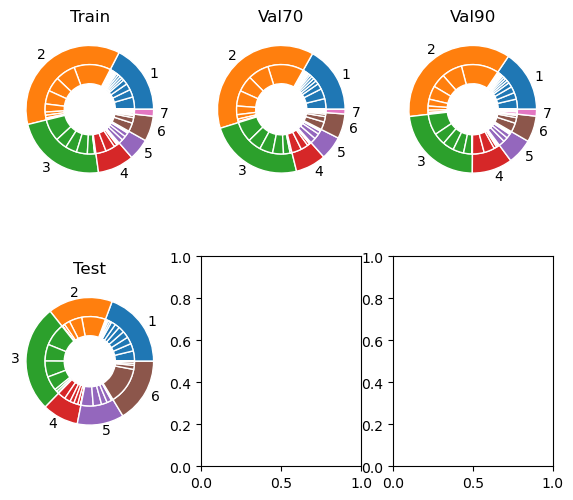

In [46]:
make_pie_charts(['Train', 'Val70', 'Val90', 'Test'], [train_df, val70_df, val90_df, test_df])

### Load previously generated datasets and merge in organism information

In [161]:
organism_df = df.drop_duplicates(subset=['Sequence'])
dfs = []

for split in ['train', 'val70', 'val90', 'test']:
    EC_df = pd.read_csv('data/CARE_resampled50cluster_medium/{}.csv'.format(split))

    EC_df = EC_df.merge(df[['Sequence', 'Tax number']], on='Sequence', how='left')
    EC_df.fillna('-1.-1.-1.-1.-1.-1.-1', inplace=True)  #fill the mising ones with unconditional organism condition
    #change Tax number column type to string
    #EC_df['Tax number'] = EC_df['Tax number'].astype(str)
    dfs.append(EC_df)

### Save sharded datasets and splits

In [174]:
name = 'CARE_resampled50cluster_medium_withTax'

#ensure the directory exists
os.makedirs('data/{}'.format(name), exist_ok=True)

for split, split_df in zip(['train', 'val70', 'val90', 'test'], dfs):

    split_df.to_csv('data/{}/{}.csv'.format(name, split), index=False)
                    
    sequences = split_df['Sequence'].values.tolist()
    ECs = split_df['EC number'].values.tolist()
    taxes = split_df['Tax number'].values.tolist()

    output_dir = 'data/sharded_datasets/{}/{}'.format(name, split)
    columns = {'sequence': 'str', 'ec': 'str', 'tax': 'str'} 
    with MDSWriter(out=output_dir, columns=columns) as out:
        for seq, ec, tax in zip(sequences, ECs, taxes):
            out.write({'sequence': seq, 'ec': ec, 'tax': tax})

### save these datasets for perplexity analysis

In [1]:
with open('data/ECs_generation/train_common_ecs.txt', 'r') as f:
    train_common_ecs = f.read().splitlines()
with open('data/ECs_generation/train_rare_ecs.txt', 'r') as f:
    train_rare_ecs = f.read().splitlines()

In [4]:
train_df = pd.read_csv('data/CARE_resampled50cluster_medium_withTax/train.csv')
train_df

,Entry,Entry Name,Sequence,EC number,Length,EC All,clusterRes50,clusterRes30,clusterRes70,clusterRes90,EC3,EC2,EC1,cluster50size,weighted_prob_sequence,weighted_prob,Tax number
0,B6YQF6,SYE_AZOPC,MKARVRFAPSPTGPLHIGSIRTALYNYLFAKKYHGDFILRIEDTDS...,6.1.1.17,494,6.1.1.17,A0M6K0,A3DD54,B6YQF6,B6YQF6,6.1.1,6.1,6,12,0.286952,0.286952,2.976.200643.171549.-1.511434.511435
1,Q6GZN7,088R_FRG3G,MHGCNCNRVSGHLSAVRSSGLENGPFGPSGFGPSMWFTMHSGAAER...,1.8.3.2,150,1.8.3.2,Q6GZN7,Q6GZN7,Q6GZN7,Q6GZN7,1.8.3,1.8,1,1,1.000000,1.000000,10239.2732007.2732523.2732555.10486.10492.10493
2,Q9KAH8,ALLB_HALH5,MKRFDLIIRSSTVVTETTTYRADVAIRNGIVSAITEPGSISSDDGP...,3.5.2.5,438,3.5.2.5,Q9KAH8,Q9WYH0,Q9KAH8,Q9KAH8,3.5.2,3.5,3,1,1.000000,1.000000,2.1239.91061.1385.186817.2893055.86665
3,Q58GE8,GPPS_IPSPI,MFKLAQRLPKSVSSLGSQLSKNAPNQLAAATTSQLINTPGIRHKSR...,2.5.1.1,416,2.5.1.1,Q58GE8,Q58GE8,Q58GE8,Q58GE8,2.5.1,2.5,2,1,1.000000,1.000000,2759.6656.50557.7041.7042.55979.-1
4,P20331,ENLYS_BPT3,MAKVQFKPRATTEAIFVHCSATKPSQNVGVREIRQWHKEQGWLDVG...,3.5.1.28,151,3.5.1.28,Q3ZFI3,Q3ZFI3,Q3ZFI3,P20331,3.5.1,3.5,3,4,0.419060,0.419060,10239.2731618.2731619.-1.2731643.2732693.2732707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152758,Q8Y914,RIBC_LISMO,MEVSHVTLAPNKDSRAAVLTIGKFDGVHIGHQTILNTALSIKKENE...,2.7.7.2,246,2.7.7.2,Q8Y914,Q8Y914,Q8Y914,Q8Y914,2.7.7,2.7,2,1,1.000000,1.000000,2.1239.91061.1385.186820.1637.1639
152759,Q8ZKL1,RLUF_SALTY,MLTDTSTRLNKYISESGICSRREADRFIEQGNVFINGKRAAIGDQV...,5.4.99.21,289,5.4.99.-; 5.4.99.21,Q83IR6,Q83IR6,Q83IR6,Q8ZKL1,5.4.99,5.4,5,6,0.358197,0.358197,2.1224.1236.91347.543.590.28901
152760,Q0UVK8,NNRD_PHANO,MASATRKDLLKKVYNMVPPMLESFHKGQLGRVAVIGGSEDYTGAPY...,4.2.1.93,325,4.2.1.93,Q5B0D6,B5DHB2,Q0UVK8,Q0UVK8,4.2.1,4.2,4,6,0.358197,0.358197,2759.4890.147541.92860.5020.1351751.13684
152761,Q9RV16,ACCA_DEIRA,MTSTPADALRELEARVRDLEATAERTGQNLDAALAPLRTQLETLRR...,2.1.3.15,316,2.1.3.15,Q9RV16,Q5LME7,Q9RV16,Q9RV16,2.1.3,2.1,2,1,1.000000,1.000000,2.1297.188787.118964.183710.1298.1299


In [5]:
#common ECs, overlapping with the ones that are being generated
train_common_df = train_df[train_df['EC number'].isin(train_common_ecs)]
train_common_df

,Entry,Entry Name,Sequence,EC number,Length,EC All,clusterRes50,clusterRes30,clusterRes70,clusterRes90,EC3,EC2,EC1,cluster50size,weighted_prob_sequence,weighted_prob,Tax number
16,A7Z9Q0,ATPB_BACVZ,MKKGRVSQVLGPVVDVRFEDGHLPAIYNAIKVSQPATGENEVGIDL...,7.1.2.2,473,7.1.2.2,Q4A604,Q8D3J3,Q180W5,P37809,7.1.2,7.1,7,814,0.129837,0.129837,2.1239.91061.1385.186817.1386.492670
17,Q1GZB7,KAD_METFK,MRVILLGAPGAGKGTQATFIKEAFDIPQISTGDMLRAAVKAGTQLG...,2.7.4.3,218,2.7.4.3,Q47B46,B5RRM3,Q1IDV1,Q1GZB7,2.7.4,2.7,2,165,0.163775,0.163775,2.1224.28216.32003.32011.404.405
23,B5ENT6,FPG_ACIF5,MPELPEVEVTRLGIAPHLRGRRLEGAVVRDSRLRLPVNDDLAARVS...,4.2.99.18,270,3.2.2.23; 4.2.99.18,B1XS61,C1DBB4,B5ENT6,B5ENT6,4.2.99,4.2,4,8,0.324734,0.324734,2.1224.1807140.225057.225058.119977.920
25,A6T006,TRPA_JANMA,MSRIQSTLAALAAKNKKGLIPFITAGDPAPELTVPLMHALVAGGAD...,4.2.1.20,265,4.2.1.20,A0AZ71,O22018,Q46YW7,A6T006,4.2.1,4.2,4,62,0.195041,0.195041,2.1224.28216.80840.75682.29580.-1
46,Q8A4M8,GLSA_BACTN,MDKKVTLAQLKEVVQEAYDQVKTNTGGKNADYIPYLANVNKDLFGI...,3.5.1.2,321,3.5.1.2,Q5LI65,A5CLW1,Q5LI65,Q8A4M8,3.5.1,3.5,3,4,0.419060,0.419060,2.976.200643.171549.815.816.818
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152724,Q3ZJ77,RPOA_TUPAK,MIKIIIKETFSFKSVLMHFLKEKVSNNKISKKNKIMPSYTLLSCID...,2.7.7.6,577,2.7.7.6,Q3ZJ77,Q20F02,Q3ZJ77,Q3ZJ77,2.7.7,2.7,2,1,1.000000,1.000000,2759.3041.33103.31306.2682567.2045111.-1
152738,Q2Y796,COAX_NITMU,MNPLLLAVDSGNTRVKWGLHDGRNWLMQGVAAQGDRVQLEREWRDL...,2.7.1.33,262,2.7.1.33,Q2Y796,Q5P2L1,Q2Y796,Q2Y796,2.7.1,2.7,2,1,1.000000,1.000000,2.1224.28216.32003.206379.35798.1231
152739,Q2TQ17,NU2M_SYLGA,MNPMTSTILLMTIMSGTSIVLMSSHWFMTWLGFEMNMMAIIPILMK...,7.1.1.2,347,7.1.1.2,Q5Y4Q9,Q00229,Q2TQ20,Q2TQ17,7.1.1,7.1,7,93,0.180747,0.180747,2759.7711.40674.9362.9376.128149.-1
152746,Q8VDF3,DAPK2_MOUSE,MVQASMRSPNMETFKQQKVEDFYDIGEELGSGQFAIVKKCREKSTG...,2.7.11.1,370,2.7.11.1,Q9UIK4,Q9TXJ0,Q9UIK4,Q9UIK4,2.7.11,2.7,2,2,0.590616,0.590616,2759.7711.40674.9989.10066.10088.-1


In [6]:
#all of the rare ECs with less than 10 values
train_rare_ecs = train_df['EC number'].value_counts()[train_df['EC number'].value_counts() < 10].index
train_rare_df = train_df[train_df['EC number'].isin(train_rare_ecs)]
train_rare_df

,Entry,Entry Name,Sequence,EC number,Length,EC All,clusterRes50,clusterRes30,clusterRes70,clusterRes90,EC3,EC2,EC1,cluster50size,weighted_prob_sequence,weighted_prob,Tax number
7,P20370,DC4C_ACIAD,MNDEQRYKQGLEVRTEVLGEKHVNRSLENLNDFNQDFQNFISRFAW...,4.1.1.44,134,4.1.1.44,P20370,P20370,P20370,P20370,4.1.1,4.1,4,1,1.000000,1.000000,2.1224.1236.2887326.468.469.202950
11,Q8CQD2,BUTA_STAES,MSKTAIITGAAGGLGKGIAERLANDGFNIVLQDINEALLLETEKEF...,1.1.1.304,257,1.1.1.304,Q8CQD2,Q9Z8P2,Q8CQD2,Q8CQD2,1.1.1,1.1,1,2,0.590616,0.590616,2.1239.91061.1385.90964.1279.1282
15,Q2KJ83,CBPN_BOVIN,MSDLVSIFLHLLLFKLVAPVTFRHHRYDDLVRMLYKVHNECPHITR...,3.4.17.3,462,3.4.17.3,Q9JJN5,O17754,Q9JJN5,Q2KJ83,3.4.17,3.4,3,11,0.294300,0.294300,2759.7711.40674.91561.9895.9903.-1
35,Q940S3,UAP1_ARATH,MIEPSMERENGALTAATTTTTAVTSPPPMASSPRQALVERLKDYGQ...,2.7.7.83,505,2.7.7.23; 2.7.7.83,Q940S3,O74933,O64765,Q940S3,2.7.7,2.7,2,5,0.383224,0.383224,2759.35493.3398.3699.3700.3701.-1
36,O87696,CBIF_PRIMG,MKLYIIGAGPGDPDLITVKGLKLLQQADVVLYADSLVSQDLIAKSK...,2.1.1.271,258,2.1.1.271,O87696,P0A2G9,O87696,O87696,2.1.1,2.1,2,1,1.000000,1.000000,2.1239.91061.1385.186817.2800373.-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152666,Q73Q47,FABV_TREDE,MIVKPMVRNNICLNAHPQGCKKGVEDQIEYTKKRITAEVKAGAKAP...,1.3.1.44,397,1.3.1.44,C0QVH0,Q5QYR6,Q73Q47,Q73Q47,1.3.1,1.3,1,4,0.419060,0.419060,2.203691.203692.136.2845253.157.158
152736,R9QMZ0,ATERP_PINCO,MALLSVAPLQKPLTSCSPFSTTMPTLGVCTPRKVVTPSIIMCSTTA...,4.2.3.108,616,4.2.3.108; 4.2.3.109; 4.2.3.111; 4.2.3.15,Q948Z0,Q8GUE4,F2XFA6,R9QMR5,4.2.3,4.2,4,79,0.186239,0.186239,2759.35493.58019.1446380.3318.3337.-1
152750,Q034G9,PAGL2_LACP3,MNQNKQFSIVIAGGGSTYTAGIVMMLLENAERFPLRALKLYDIDEE...,3.2.1.122,461,3.2.1.122,Q03C44,Q03C44,Q034G9,Q034G9,3.2.1,3.2,3,6,0.358197,0.358197,2.1239.91061.186826.33958.2759736.1597
152756,P37773,MPL_ECOLI,MRIHILGICGTFMGGLAMLARQLGHEVTGSDANVYPPMSTLLEKQG...,6.3.2.45,457,6.3.2.45,P43948,A9WRD7,P37773,P37773,6.3.2,6.3,6,2,0.590616,0.590616,2.1224.1236.91347.543.561.562


In [7]:
#dfs = [train_common_df, train_rare_df]
dfs = [train_rare_df]
name = 'CARE_resampled50cluster_medium_withTax'

#ensure the directory exists
os.makedirs('data/{}'.format(name), exist_ok=True)

for split, split_df in zip(['train_rare'], dfs): #['train_common', 'train_rare']

    split_df.to_csv('data/{}/{}.csv'.format(name, split), index=False)
                    
    sequences = split_df['Sequence'].values.tolist()
    ECs = split_df['EC number'].values.tolist()
    taxes = split_df['Tax number'].values.tolist()

    output_dir = 'data/sharded_datasets/{}/{}'.format(name, split)
    columns = {'sequence': 'str', 'ec': 'str', 'tax': 'str'} 
    with MDSWriter(out=output_dir, columns=columns) as out:
        for seq, ec, tax in zip(sequences, ECs, taxes):
            out.write({'sequence': seq, 'ec': ec, 'tax': tax})

### Look for organisms that aren't really found in prokaryotes

In [3]:
train_df = pd.read_csv('data/CARE_resampled50cluster_medium_withTax/train.csv')
train_df['superkingdom'] = train_df['Tax number'].str.split('.').str[0]
train_df['bacteria'] = train_df['superkingdom'] == '2'

In [5]:
# test_df = pd.read_csv('data/CARE_resampled50cluster_medium_withTax/test.csv')
val70_df = pd.read_csv('data/CARE_resampled50cluster_medium_withTax/val70.csv')
val90_df = pd.read_csv('data/CARE_resampled50cluster_medium_withTax/val90.csv')
heldout_df = pd.concat([val70_df, val90_df])

In [6]:
value_counts = train_df['EC number'].value_counts().reset_index()
bacteria_counts = train_df.groupby('EC number')['bacteria'].sum().reset_index()
merged = pd.merge(value_counts, bacteria_counts, on='EC number')
merged['fraction'] = merged['bacteria'] / merged['count']
merged = merged.sort_values(by=['fraction', 'count'], ascending=[True, False])

In [29]:
# ECs = merged['EC number'].values[:24].tolist()

In [30]:
#save to txt
# with open('data/ECs_generation/low_bacteria_ecs.txt', 'w') as f:
#     for ec in ECs:
#         f.write(ec + '\n')

instead make a new train and holdout set

In [15]:
merged['not bacteria count'] = merged['count'] - merged['bacteria']
selected = merged[merged['fraction'] != 0][merged['not bacteria count'] > 300]
# selected = merged[merged['fraction'] != 0][merged['count'] > 300][merged['fraction'] < 0.25]
selected

/tmp/ipykernel_2006081/930566762.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  selected = merged[merged['fraction'] != 0][merged['not bacteria count'] > 300]


,EC number,count,bacteria,fraction,not bacteria count
2,7.1.1.2,1077,4,0.003714,1073
117,3.1.1.4,313,10,0.031949,303
5,3.1.3.16,838,31,0.036993,807
50,2.5.1.18,439,34,0.077449,405
0,2.7.11.1,2164,173,0.079945,1991
20,3.1.3.48,555,70,0.126126,485
28,7.1.1.9,516,132,0.255814,384
3,2.7.7.6,894,516,0.577181,378
1,5.2.1.8,1602,1022,0.637953,580


In [16]:
selected_ECs = selected['EC number'].values.tolist()
#save to txt
with open('data/ECs_generation/low_bacteria_common_ecs.txt', 'w') as f:
    for ec in selected_ECs:
        f.write(ec + '\n')

In [21]:
#remove those ECs and bacter from the train_df
train_df2 = train_df[~(train_df['EC number'].isin(selected_ECs) & train_df['bacteria'] == True)]
train_df2

,Entry,Entry Name,Sequence,EC number,Length,EC All,clusterRes50,clusterRes30,clusterRes70,clusterRes90,EC3,EC2,EC1,cluster50size,weighted_prob_sequence,weighted_prob,Tax number,superkingdom,bacteria
0,B6YQF6,SYE_AZOPC,MKARVRFAPSPTGPLHIGSIRTALYNYLFAKKYHGDFILRIEDTDS...,6.1.1.17,494,6.1.1.17,A0M6K0,A3DD54,B6YQF6,B6YQF6,6.1.1,6.1,6,12,0.286952,0.286952,2.976.200643.171549.-1.511434.511435,2,True
1,Q6GZN7,088R_FRG3G,MHGCNCNRVSGHLSAVRSSGLENGPFGPSGFGPSMWFTMHSGAAER...,1.8.3.2,150,1.8.3.2,Q6GZN7,Q6GZN7,Q6GZN7,Q6GZN7,1.8.3,1.8,1,1,1.000000,1.000000,10239.2732007.2732523.2732555.10486.10492.10493,10239,False
2,Q9KAH8,ALLB_HALH5,MKRFDLIIRSSTVVTETTTYRADVAIRNGIVSAITEPGSISSDDGP...,3.5.2.5,438,3.5.2.5,Q9KAH8,Q9WYH0,Q9KAH8,Q9KAH8,3.5.2,3.5,3,1,1.000000,1.000000,2.1239.91061.1385.186817.2893055.86665,2,True
3,Q58GE8,GPPS_IPSPI,MFKLAQRLPKSVSSLGSQLSKNAPNQLAAATTSQLINTPGIRHKSR...,2.5.1.1,416,2.5.1.1,Q58GE8,Q58GE8,Q58GE8,Q58GE8,2.5.1,2.5,2,1,1.000000,1.000000,2759.6656.50557.7041.7042.55979.-1,2759,False
4,P20331,ENLYS_BPT3,MAKVQFKPRATTEAIFVHCSATKPSQNVGVREIRQWHKEQGWLDVG...,3.5.1.28,151,3.5.1.28,Q3ZFI3,Q3ZFI3,Q3ZFI3,P20331,3.5.1,3.5,3,4,0.419060,0.419060,10239.2731618.2731619.-1.2731643.2732693.2732707,10239,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152758,Q8Y914,RIBC_LISMO,MEVSHVTLAPNKDSRAAVLTIGKFDGVHIGHQTILNTALSIKKENE...,2.7.7.2,246,2.7.7.2,Q8Y914,Q8Y914,Q8Y914,Q8Y914,2.7.7,2.7,2,1,1.000000,1.000000,2.1239.91061.1385.186820.1637.1639,2,True
152759,Q8ZKL1,RLUF_SALTY,MLTDTSTRLNKYISESGICSRREADRFIEQGNVFINGKRAAIGDQV...,5.4.99.21,289,5.4.99.-; 5.4.99.21,Q83IR6,Q83IR6,Q83IR6,Q8ZKL1,5.4.99,5.4,5,6,0.358197,0.358197,2.1224.1236.91347.543.590.28901,2,True
152760,Q0UVK8,NNRD_PHANO,MASATRKDLLKKVYNMVPPMLESFHKGQLGRVAVIGGSEDYTGAPY...,4.2.1.93,325,4.2.1.93,Q5B0D6,B5DHB2,Q0UVK8,Q0UVK8,4.2.1,4.2,4,6,0.358197,0.358197,2759.4890.147541.92860.5020.1351751.13684,2759,False
152761,Q9RV16,ACCA_DEIRA,MTSTPADALRELEARVRDLEATAERTGQNLDAALAPLRTQLETLRR...,2.1.3.15,316,2.1.3.15,Q9RV16,Q5LME7,Q9RV16,Q9RV16,2.1.3,2.1,2,1,1.000000,1.000000,2.1297.188787.118964.183710.1298.1299,2,True


In [23]:
test_df = train_df[train_df['EC number'].isin(selected_ECs) & train_df['bacteria'] == True]
test_df

,Entry,Entry Name,Sequence,EC number,Length,EC All,clusterRes50,clusterRes30,clusterRes70,clusterRes90,EC3,EC2,EC1,cluster50size,weighted_prob_sequence,weighted_prob,Tax number,superkingdom,bacteria
240,Q15QB3,SURA_PSEA6,MKLTVVTFALLAFISFNTFAKQVRLDNVAVIVDQGVVLESQIEELV...,5.2.1.8,431,5.2.1.8,Q3IFD3,Q0AC82,Q15QB3,Q15QB3,5.2.1,5.2,5,2,0.590616,0.590616,2.1224.1236.135622.72275.1621534.-1,2,True
243,Q8R5Z2,TIG_FUSNN,MNYEVKKLEKSAVEVKLHLTAEEVKPIVDKVLAHVGEHAEVAGFRK...,5.2.1.8,429,5.2.1.8,Q8R5Z2,Q2IEW0,Q8R5Z2,Q8R5Z2,5.2.1,5.2,5,1,1.000000,1.000000,2.32066.203490.203491.203492.848.851,2,True
300,Q318K7,RPOA_PROM9,MQYQIERIDHQIADDRSQTGTFLIGPLERGQATTLGNSLRRVLMGG...,2.7.7.6,311,2.7.7.6,Q2JUJ5,A0M573,A2BTB5,A2BYR3,2.7.7,2.7,2,34,0.220928,0.220928,2.1117.3028117.1890424.2881426.1218.1219,2,True
306,O34507,PRKC_BACSU,MLIGKRISGRYQILRVIGGGGMANVYLAEDIILDREVAIKILRFDY...,2.7.11.1,648,2.7.11.1,O34507,Q8R9T6,O34507,O34507,2.7.11,2.7,2,1,1.000000,1.000000,2.1239.91061.1385.186817.1386.1423,2,True
327,Q6NG98,COX2_CORDI,MEQQEKRGTVRKALLGSVIGFGGLALAGCDVEAPGGPLGTALGFGW...,7.1.1.9,362,7.1.1.9,Q8FNQ7,Q9X814,Q8FNQ7,Q6NG98,7.1.1,7.1,7,3,0.476505,0.476505,2.201174.1760.85007.1653.1716.1717,2,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152302,Q2NV80,TIG_SODGM,MQVSVETTEGLGRRVNITVAADTIEQAVKSELVNVAKKVCIDGFRK...,5.2.1.8,434,5.2.1.8,C4K4P3,Q2IEW0,A1JNN4,Q2NV80,5.2.1,5.2,5,33,0.222395,0.222395,2.1224.1236.91347.2812006.84565.63612,2,True
152303,A1SJF7,RPOZ_NOCSJ,MSGPTIAAEGVTNPPIDELLTKTDSKYKLVLYSAKRARQINAYYSQ...,2.7.7.6,110,2.7.7.6,A1SJF7,A1SJF7,A1SJF7,A1SJF7,2.7.7,2.7,2,2,0.590616,0.590616,2.201174.1760.85009.85015.1839.-1,2,True
152357,Q9CEF5,PKNB_LACLA,MIQIGKIFADRYRIIKEIGRGGMANVYQGEDTFLGDRLVAIKVLRS...,2.7.11.1,627,2.7.11.1,Q9CEF5,Q8R9T6,Q9CEF5,Q9CEF5,2.7.11,2.7,2,1,1.000000,1.000000,2.1239.91061.186826.1300.1357.1358,2,True
152628,Q5WVI9,TIG_LEGPL,MQVSVETLEGLERKVTVSVPTEKVEEEVSSRLRNLARKVKIDGFRP...,5.2.1.8,443,5.2.1.8,A5ID18,Q2IEW0,A5ID18,A5ID18,5.2.1,5.2,5,3,0.476505,0.476505,2.1224.1236.118969.444.445.446,2,True


In [24]:
dfs = [train_df2, test_df]
name = 'CARE_resampled50cluster_medium_withTax'

#ensure the directory exists
os.makedirs('data/{}'.format(name), exist_ok=True)

for split, split_df in zip(['train_common_low_bacteria', 'test_common_low_bacteria'], dfs): #['train_common', 'train_rare']

    split_df.to_csv('data/{}/{}.csv'.format(name, split), index=False)
                    
    sequences = split_df['Sequence'].values.tolist()
    ECs = split_df['EC number'].values.tolist()
    taxes = split_df['Tax number'].values.tolist()

    output_dir = 'data/sharded_datasets/{}/{}'.format(name, split)
    columns = {'sequence': 'str', 'ec': 'str', 'tax': 'str'} 
    with MDSWriter(out=output_dir, columns=columns) as out:
        for seq, ec, tax in zip(sequences, ECs, taxes):
            out.write({'sequence': seq, 'ec': ec, 'tax': tax})

### Summarize Splits

In [27]:
splits = ['val90', 'val70', 'test', 'train']
for split in splits:
    df = pd.read_csv('data/CARE_resampled50cluster_medium_withTax/{}.csv'.format(split))
    print(len(df), df['EC number'].nunique())

5243 942
5428 818
5714 177
152763 4201
